In [1]:
import numpy as np
import matplotlib.pyplot as plt


# Exercise 11.1: Linear Fit
## Data generation


In [2]:
# generate training inputs
def generate_linear_data(m:float, b:float, sigma:float=0.0, seed:int=0):
    """
    Generate linear data with gaussian noise
    Parameter:
        - m     [float] : linear weight
        - b     [float] : bias
        - sigma [float] : gaussian noise STD [default 0]
        - seed  [int]   : numpy random seed [default 0]
    Return:
        - x_train  [array], y_train [array] : training dataset
        - x_valid  [array], y_valid [array] : validation dataset
        - y_target [array]                  : noiseless output for x_valid
    """
    np.random.seed(seed)
    x_train = np.random.uniform(-1, 1, 500)
    x_valid = np.random.uniform(-1, 1, 50)
    x_valid.sort()
    y_target = m * x_valid + b # ideal (target) linear function

    y_train = np.random.normal(m * x_train + b, sigma) # actual measures from which we want to guess regression parameters
    y_valid = np.random.normal(m * x_valid + b, sigma)

    return x_train, y_train, x_valid, y_valid, y_target    
    

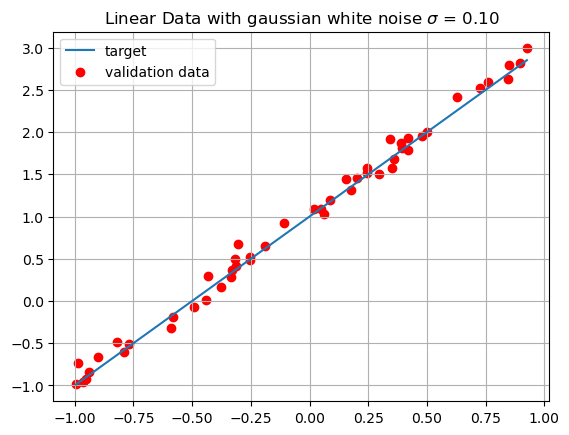

In [3]:
# target parameters of f(x) = m*x + b
m = 2 # slope
b = 1 # intersect
sigma=0.1
x_train, y_train, x_valid, y_valid, y_target=generate_linear_data(m,b, sigma)

# plot validation and target dataset
plt.title(f'Linear Data with gaussian white noise '+r"$\sigma$ = "+"%.2f"%sigma)
plt.plot(x_valid, y_target, label='target')
plt.scatter(x_valid, y_valid, color='r', label='validation data')
plt.legend()
plt.grid(True)
plt.show()

## Model definition
For linear regression is sufficient one node without activation function (the goal is to estimate a linear function)

In [4]:
# compose the NN model
import tensorflow as tf
from tensorflow import keras

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras import backend as K
from tensorflow.keras.utils import get_custom_objects

2025-10-02 11:09:10.766465: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [5]:
def init_regression_model(optimizer='sgd', loss='mse', metrics=['mse'], kernel_initializer='glorot_uniform'):
    """
    Create a one-neuron network to perform linear regression
    Parameter:
        - optimizer [string] : algorithm to optimize the regression parameters
        - loss      [string] : cost function to minimize on the train dataset
        - metrics   [list]   : cost functions to evaluate on the validation dataset
    Return:
        - model     [Keras.Sequential]
    """
    model=tf.keras.Sequential()
    model.add(
        Dense(
            1, input_shape=(1,),
            kernel_initializer=kernel_initializer
        )
    )

    model.compile(optimizer=optimizer, loss=loss, metrics=metrics)
    
    return model

In [6]:
model=init_regression_model(metrics=['mse', 'accuracy'])

history = model.fit(x=x_train, y=y_train,
          batch_size=32, epochs=30,
          shuffle=True, # a good idea is to shuffle input before at each epoch
          validation_data=(x_valid, y_valid))


Epoch 1/30


/home/td/miniconda3/envs/dl/lib/python3.12/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.0000e+00 - loss: 1.1970 - mse: 1.1970 - val_accuracy: 0.0000e+00 - val_loss: 0.8287 - val_mse: 0.8287
Epoch 2/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0000e+00 - loss: 0.7880 - mse: 0.7880 - val_accuracy: 0.0000e+00 - val_loss: 0.5344 - val_mse: 0.5344
Epoch 3/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0000e+00 - loss: 0.5327 - mse: 0.5327 - val_accuracy: 0.0000e+00 - val_loss: 0.3617 - val_mse: 0.3617
Epoch 4/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0000e+00 - loss: 0.3337 - mse: 0.3337 - val_accuracy: 0.0000e+00 - val_loss: 0.2557 - val_mse: 0.2557
Epoch 5/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0000e+00 - loss: 0.2554 - mse: 0.2554 - val_accuracy: 0.0000e+00 - val_loss: 0.1885 - val_mse: 0.1885
Epoch 6/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0000e+00 - loss: 0.1857 - mse: 0.1857 - val_accuracy: 0.0000e+00 - val_loss: 0.1428 - val_mse: 0.1428
Epoch 7/30
16/

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


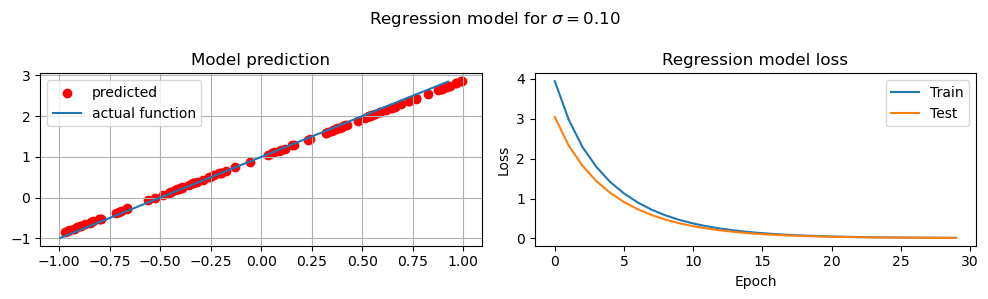

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.0000e+00 - loss: 0.0137 - mse: 0.0137
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.0000e+00 - loss: 0.0036 - mse: 0.0036
Validation loss: 0.015073204413056374
Target loss: 0.004011789336800575
linear weight prediction [[1.8879802]]
bias prediction [0.9875549]


In [7]:
fig, ax = plt.subplots(1, 2, figsize=(10,3))

x_predicted = np.random.uniform(-1, 1, 100)
y_predicted = model.predict(x_predicted)

fig.suptitle('Regression model for '+ r"$\sigma=$"+"%.2f"%sigma)
ax[0].set_title('Model prediction')
ax[0].scatter(x_predicted, y_predicted,color='r', label='predicted')
ax[0].plot(x_valid, y_target, label='actual function')
ax[0].grid(True)
ax[0].legend()


# look into training history
# Plot training & validation loss values
ax[1].plot(history.history['loss'])
ax[1].plot(history.history['val_loss'])
ax[1].set_title('Regression model loss')
ax[1].set_ylabel('Loss')
ax[1].set_xlabel('Epoch')
ax[1].legend(['Train', 'Test'], loc='best')
plt.tight_layout()
plt.show()

# evaluate model
valid_score = model.evaluate(x_valid, y_valid, batch_size=32, verbose=1)
# evaluate model with the exact curve
target_score = model.evaluate(x_valid, y_target, batch_size=32, verbose=1)
# print performance
print('Validation loss:', valid_score[0])
print('Target loss:', target_score[0])
m_pred, b_pred =model.get_weights()
print('linear weight prediction', m_pred)
print('bias prediction', b_pred)


## Variation along number of epochs


In [8]:
m1 = init_regression_model()
m1.summary()
h1 = m1.fit(
    x=x_train, y=y_train,
    batch_size=32, epochs=100,
    shuffle=True, # a good idea is to shuffle input before at each epoch
    validation_data=(x_valid, y_valid)
)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1 (Dense)                 │ (None, 1)              │             2 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2 (8.00 B)

 Trainable params: 2 (8.00 B)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0965 - mse: 1.0965 - val_loss: 0.7197 - val_mse: 0.7197
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6244 - mse: 0.6244 - val_loss: 0.4402 - val_mse: 0.4402
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3933 - mse: 0.3933 - val_loss: 0.2833 - val_mse: 0.2833
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2328 - mse: 0.2328 - val_loss: 0.1911 - val_mse: 0.1911
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1849 - mse: 0.1849 - val_loss: 0.1352 - val_mse: 0.1352
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1234 - mse: 0.1234 - val_loss: 0.0999 - val_mse: 0.0999
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0931 - mse: 0.0931 - val_loss: 0.0764 - val_mse: 0.0764
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0731 - mse: 0.0731 - val_loss: 0.0603 - val_mse: 0.0603
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.060

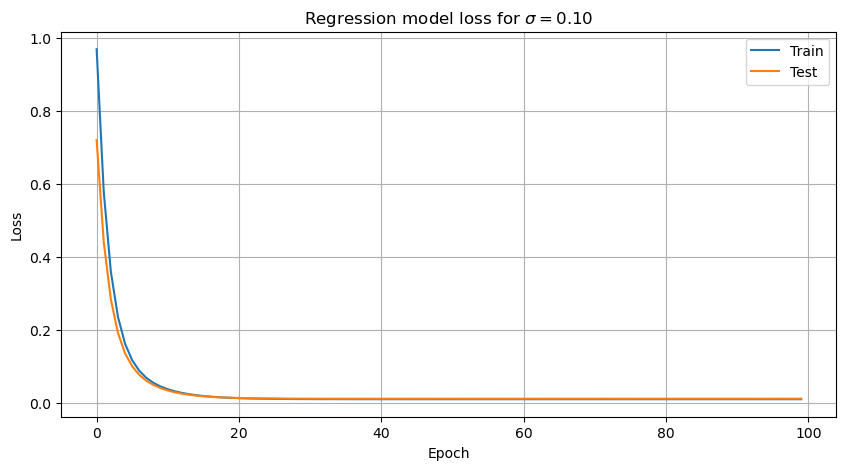

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0114 - mse: 0.0114
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 2.0697e-04 - mse: 2.0697e-04
Validation loss: 0.011215009726583958
Target loss    : 0.00017979490803554654

linear weight prediction: [[1.8879802]]
bias prediction         : [0.9875549]


In [9]:
plt.figure(figsize=(10,5))

# look into training history
# Plot training & validation loss values
plt.plot(h1.history['loss'])
plt.plot(h1.history['val_loss'])
plt.title('Regression model loss for '+ r"$\sigma=$"+"%.2f"%sigma)
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='best')
plt.grid(True)
plt.show()


# evaluate model
valid_score = m1.evaluate(x_valid, y_valid, batch_size=32, verbose=1)
# evaluate model with the exact curve
target_score = m1.evaluate(x_valid, y_target, batch_size=32, verbose=1)
# print performance
print('Validation loss:', valid_score[0])
print('Target loss    :', target_score[0])
print()
m_pred, b_pred =model.get_weights()
print('linear weight prediction:', m_pred)
print('bias prediction         :', b_pred)


## Variation of train dataset dimension


In [ ]:
from tqdm import tqdm

loss=[]
val_loss=[]


scores=[]

# consider different slice of the dataset
for k in tqdm(range(1, len(x_train), 10)):

    model = init_regression_model()
    
    history = model.fit(x=x_train[:k], y=y_train[:k],
            batch_size=32, epochs=60,
            shuffle=True, # a good idea is to shuffle input before at each epoch
            validation_data=(x_valid, y_valid),
            verbose=0
    )
    loss.append(history.history['loss'][-1])
    val_loss.append(history.history['val_loss'][-1])


 36%|███████████████████████████████████████████████████████████████                                                                                                                | 18/50 [01:07<02:01,  3.79s/it]

In [ ]:
plt.figure(figsize=(10,3))
plt.title('Loss varing train dataset dimension [optimizer sgd, epochs=60]')
plt.plot(range(1, len(x_train), 10), loss, marker='*',label='train loss')
plt.plot(range(1, len(x_train), 10), val_loss, marker='o', label='validation loss')
plt.ylabel('Loss')
plt.xlabel('train dataset dimension')
plt.grid(True)
plt.legend()
plt.show()

### Variation of train dimension with different epochs

In [ ]:
from tqdm import tqdm

sigma=0.0
y_train = np.random.normal(m * x_train + b, sigma) # actual measures from which we want to guess regression parameters
y_valid = np.random.normal(m * x_valid + b, sigma)


ep_loss=[]
ep_valloss=[]

ep=[5, 20, 40, 60]

for e in ep:
    loss=[]
    val_loss=[]
    
    for k in tqdm(range(1, len(x_train), 20), desc=f'{e} epochs'):
    
        model = init_regression_model()
        
        #print(f'\t\t --> size {k} <-- ')
        history = model.fit(x=x_train[:k], y=y_train[:k],
                batch_size=32, epochs=e,
                shuffle=True, # a good idea is to shuffle input before at each epoch
                validation_data=(x_valid, y_valid),
                verbose=0
        )
        loss.append(history.history['loss'][-1])
        val_loss.append(history.history['val_loss'][-1])
    ep_loss.append(loss)
    ep_valloss.append(val_loss)

    

In [ ]:
fig, axs = plt.subplots(1, 2,figsize=(10,3))
axs[0].set_title('Loss on train dataset')
for e in range(3):
    axs[0].plot(range(1, len(x_train), 20), ep_loss[e], marker='*',label=f'{ep[e]} epochs')
axs[0].set_xlabel('train dataset dimension')

axs[0].legend()
axs[0].grid()

axs[1].set_title('Loss on validation dataset')
for e in range(3):
    axs[1].plot(range(1, len(x_train), 20), ep_valloss[e], marker='o', label=f'{ep[e]} epochs')

axs[1].set_xlabel('train dataset dimension')

axs[1].legend()
axs[1].grid()

plt.show()

## White Noise

In [ ]:
import numpy as np

# generate training inputs
np.random.seed(0)
x_train = np.random.uniform(-1, 1, 500)
x_valid = np.random.uniform(-1, 1, 50)
x_valid.sort()
y_target = m * x_valid + b # ideal (target) linear function

sigma_loss=[]
sigma_val_loss=[]

weights=[]
biases =[]

sigmas=np.arange(0, 2, 0.1)

fig, axs = plt.subplots(int((len(sigmas)/10)//2), 2, figsize=(10, 3*((len(sigmas)/10)//4)))
for n, sigma in enumerate(sigmas):

  print(f'\t\t--> sigma {sigma} <--')
  #sigma = 0.0 # noise standard deviation, for the moment it is absent
  y_train = np.random.normal(m * x_train + b, sigma) # actual measures from which we want to guess regression parameters
  y_valid = np.random.normal(m * x_valid + b, sigma)
  

  model=init_regression_model()
  # fit the model using training dataset
  # over 10 epochs of 32 batch size each
  # report training progress against validation data
  history = model.fit(x=x_train, y=y_train,
            batch_size=32, epochs=30,
            shuffle=True, # a good idea is to shuffle input before at each epoch
            validation_data=(x_valid, y_valid),
            verbose=0
  )

  weights.append(model.get_weights()[0][0][0])
  biases.append(model.get_weights()[1][0])
    
  x_predicted = np.random.uniform(-1, 1, 100)
  y_predicted = model.predict(x_predicted)

  """if n%10==0:
      axs[(n/10)//4, (n/10)%4].set_title(f'data with noise {"%.2f" % sigma}')
      axs[(n/10)//4, (n/10)%4].scatter(x_train, y_train, label='train')
      axs[(n/10)//4, (n/10)%4].scatter(x_valid, y_valid, label='validation')
      axs[(n/10)//4, (n/10)%4].plot(x_predicted, y_predicted, c='r', label='prediction')

      axs[(n/10)//4, (n/10)%4].legend()
      axs[(n/10)//4, (n/10)%4].set_ylim([-3.1, 3.1])
    """

  sigma_loss.append(history.history['loss'][-1])
  sigma_val_loss.append(history.history['val_loss'][-1])

#plt.tight_layout()
#plt.show()


In [ ]:
plt.figure(figsize=(8, 3))

plt.plot(sigmas, sigma_loss, marker='*',label='train loss')
plt.plot(sigmas, sigma_val_loss, marker='o', label='validation loss')

plt.xlabel('noise')

plt.title('MSE')
plt.legend()
plt.grid()
plt.show()

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(10,3))

ax[0].set_title('linear regression weights')
ax[0].plot(sigmas, weights, '--d')
ax[0].grid()
ax[0].set_xlabel('sigma')

ax[1].set_title('linear regression biases')
ax[1].plot(sigmas, biases, '--^')
ax[1].grid()
ax[1].set_xlabel('sigma')
plt.show()

### Uniform search on parameters (x_train_dimension, epochs) for different values of sigma

In [116]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
grid=pd.read_csv('regression_grid.csv')
grid

,Unnamed: 0,sigma,epochs,train_dim,loss,val_loss
0,0,0.073645,85,39,0.051839,0.061568
1,1,0.073645,26,198,0.008271,0.008431
2,2,0.073645,30,20,0.635386,0.446353
3,3,0.073645,77,412,0.005514,0.003803
4,4,0.073645,48,339,0.008353,0.009227
...,...,...,...,...,...,...
995,995,0.647308,94,482,0.404973,0.543839
996,996,0.647308,87,479,0.396619,0.335324
997,997,0.647308,47,283,0.426991,0.432184
998,998,0.647308,57,463,0.403493,0.352792


In [117]:
sigmas = grid.sort_values(by='sigma')['sigma'].unique()[:2].tolist()+\
         grid.sort_values(by='sigma')['sigma'].unique()[3:-4].tolist()+\
         grid.sort_values(by='sigma')['sigma'].unique()[-1:].tolist()

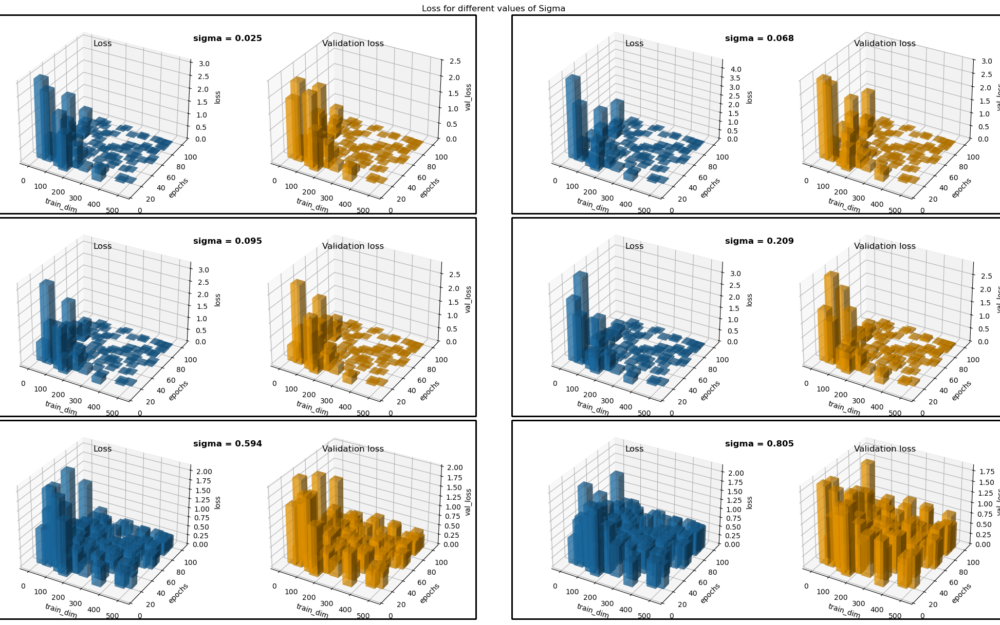

In [118]:
fig = plt.figure(figsize=(20,12),layout='constrained')
fig.suptitle('Loss for different values of Sigma')

rows=len(sigmas)//2
cols=4

subfigs = fig.subfigures(rows, 2, wspace=0.07)
for k, sigma in enumerate(sigmas):

    gr=grid.loc[grid['sigma']==sigma].reset_index(drop=True)
    gr.sort_values(by='loss').reset_index(drop=True)
    
    X = gr['train_dim'].array
    Y = gr['epochs'].array
    Z1 = gr['loss'].array
    Z2 = gr['val_loss'].array

    subfigs[k//2][k%2].suptitle(f'sigma = {"%.3f"%sigma}', y=0.9, fontweight="bold")
    subfigs[k//2][k%2].set_linewidth(1)

    subfigs[k//2][k%2].set_edgecolor('black')
    #subfigs[k//2][k%2].subplots_adjust(right=1.5)

    ax = subfigs[k//2][k%2].add_subplot(1, 2, 1 ,projection='3d')
    ax.set_title(f'Loss', y=0.9)
    ax.bar3d(X-25 , Y-5, np.zeros(len(Z1)), 50,10,Z1, label=f'loss sigma={sigma}', alpha=0.5)
    
    ax.set_ylabel('epochs')
    ax.set_xlabel('train_dim')
    ax.set_zlabel('loss', rotation = 90)
    

    ax = subfigs[k//2][k%2].add_subplot(1, 2, 2 ,projection='3d')
    ax.set_title('Validation loss', y=0.9)
    ax.bar3d(X-25 , Y-5, np.zeros(len(Z2)), 50,10,Z2, label=f'loss sigma={sigma}', alpha=0.5, color='orange')
    ax.set_ylabel('epochs')
    ax.set_xlabel('train_dim')
    ax.set_zlabel('val_loss', rotation = 90)

    
plt.show()

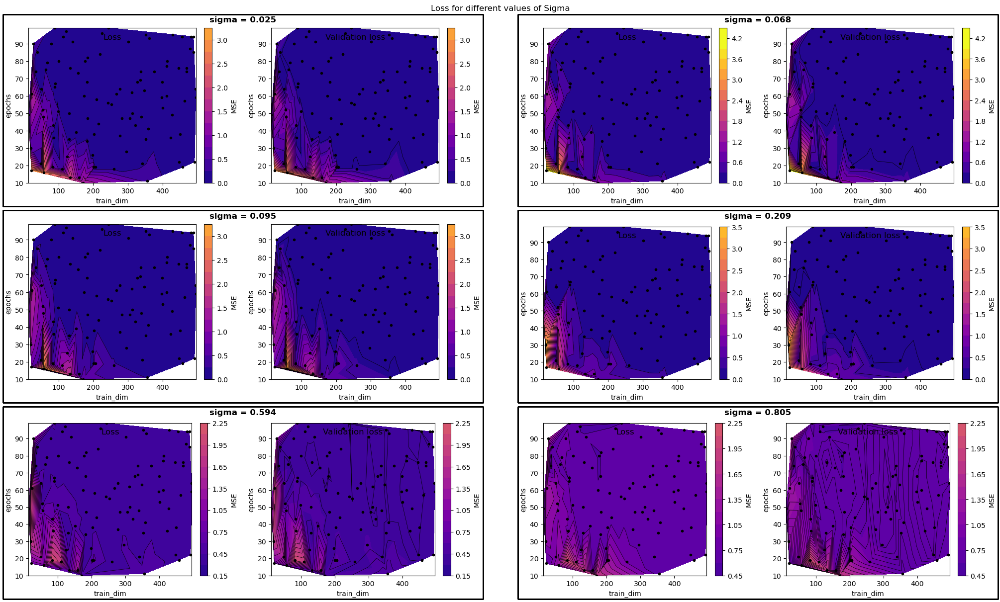

In [248]:
fig = plt.figure(figsize=(20,12),layout='constrained')
fig.suptitle('Loss for different values of Sigma')

rows=len(sigmas)//2
cols=4

subfigs = fig.subfigures(rows, 2, wspace=0.07)
for k, sigma in enumerate(sigmas):

    gr=grid.loc[grid['sigma']==sigma].reset_index(drop=True)
    gr.sort_values(by='loss').reset_index(drop=True)
    
    X = gr['train_dim'].array
    Y = gr['epochs'].array
    Z1 = gr['loss'].array
    Z2 = gr['val_loss'].array

    subfigs[k//2][k%2].suptitle(f'sigma = {"%.3f"%sigma}', fontweight="bold")
    subfigs[k//2][k%2].set_linewidth(1)

    subfigs[k//2][k%2].set_edgecolor('black')
    #subfigs[k//2][k%2].subplots_adjust(right=1.5)

    ax1 = subfigs[k//2][k%2].add_subplot(1, 2, 1 )
    ax1.set_title(f'Loss', y=0.9)
    ax1.tricontour(X, Y,Z1, levels=14, linewidths=0.5, colors='k', vmin=0, vmax=4)
    cntr1 = ax1.tricontourf(X, Y,Z1, levels=14, cmap='plasma', vmin=0, vmax=4)
    
    ax1.set_ylabel('epochs')
    ax1.set_xlabel('train_dim')
    #ax.set_zlabel('loss', rotation = 90)
    ax1.plot(X, Y, 'ko', ms=3)
    subfigs[k//2][k%2].colorbar(cntr1, ax=ax1, label='MSE')
    

    ax = subfigs[k//2][k%2].add_subplot(1, 2, 2 )
    ax.set_title('Validation loss', y=0.9)
    ax.tricontour(X, Y,Z2, levels=14, linewidths=0.5, colors='k', vmin=0, vmax=4)
    cntr = ax.tricontourf(X, Y,Z1, levels=14, cmap='plasma', vmin=0, vmax=4)
    ax.set_ylabel('epochs')
    ax.set_xlabel('train_dim')
    ax.plot(X, Y, 'ko', ms=3)
    subfigs[k//2][k%2].colorbar(cntr, ax=ax, label='MSE')
    
    
plt.show()

It's visible that the best fits are obtained with the max number of epochs and train dataset dimension

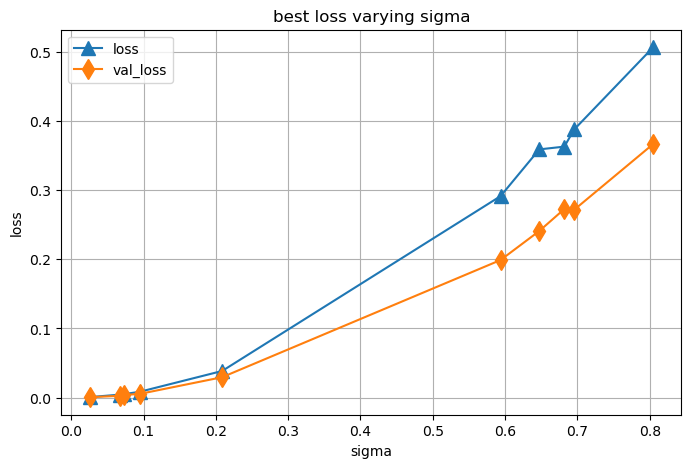

In [125]:
plt.figure(figsize=(8,5))
plt.title('best loss varying sigma')
plt.plot(
    grid.sort_values(by='sigma')['sigma'].unique(),
    [grid.loc[grid['sigma']==sigma]['loss'].min() for sigma in grid.sort_values(by='sigma')['sigma'].unique()],
    '-^',
    markersize=10,
    label='loss'
)
plt.plot(
    grid.sort_values(by='sigma')['sigma'].unique(),
    [grid.loc[grid['sigma']==sigma]['val_loss'].min() for sigma in grid.sort_values(by='sigma')['sigma'].unique()],
    '-d',
    markersize=10,
    label='val_loss'
)
plt.ylabel('loss')
plt.xlabel('sigma')
plt.grid()
plt.legend()
plt.show()


# Exercise 11.2

Try to extend the model to obtain a reasonable fit of the following polynomial of order 3:

$$
f(x)=4-3x-2x^2+3x^3
$$
for $x \in [-1,1]$.

Find good (& reasonable) choices for:

- the number of layers
- the number of neurons in each layer
- the activation function
- the optimizer
- the loss function
  
Check your NN model by seeing how well your fits predict newly generated test data (including on data outside the range you fit. How well do your NN do on points in the range of $x$ where you trained the model? How about points outside the original training data set?
Summarize what you have learned about the relationship between model complexity (number of parameters), goodness of fit on training data, and the ability to predict well.

In [6]:
import numpy as np
import matplotlib.pyplot as plt
# compose the NN model
import tensorflow as tf
from tensorflow import keras

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras import backend as K
from tensorflow.keras.utils import get_custom_objects


from tqdm import tqdm

In [7]:
def pol(x):
  return 4-3*x - 2*x**2 + 3*x**3

In [8]:
def generate_poly_data(pol, seed=0):
    # generate training inputs
    np.random.seed(seed)
    x_train = np.random.uniform(-1, 1, 500)
    x_valid = np.random.uniform(-1, 1, 50)
    x_valid.sort()
    
    
    y_target =  pol(x_valid)# ideal (target) polynomial
    
    sigma = 0.1 # noise standard deviation, for the moment it is absent
    y_train = np.random.normal(pol(x_train), sigma) # actual measures from which we want to guess regression parameters
    y_valid = np.random.normal(pol(x_valid), sigma)

    return x_train, y_train, x_valid, y_valid, y_target

In [9]:
x_train, y_train, x_valid, y_valid, y_target = generate_poly_data(pol)

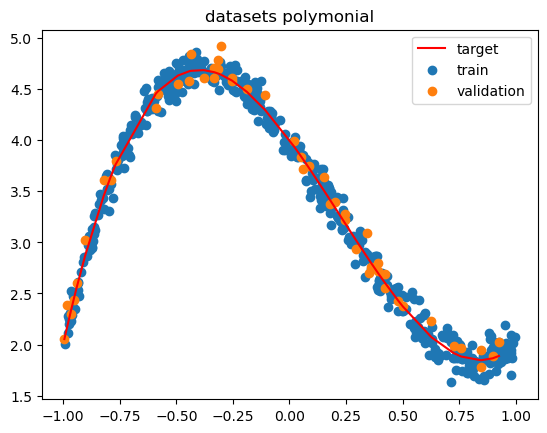

In [10]:
plt.title('datasets polymonial')

plt.plot(x_valid, y_target, c='r', label='target')
plt.scatter(x_train, y_train, label='train')
plt.scatter(x_valid, y_valid, label='validation')

plt.legend()
plt.show()


# Testing architectures
in the file [model_def.py](model_def.py) the function test_arch(line 139) is used to select the best performing NN architecture at fixed number of layers, optimizer and activation function testing all the possible combination in n_layers of different neuron's numbers per layer.



In [4]:
from model_def import test_arch
from drawing import DrawNN
import os

import matplotlib.pyplot as plt
import numpy as np

2025-10-03 15:04:13.889262: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [5]:
import pandas as pd
from tensorflow.keras.layers import Dense, Activation, Input


In [34]:
def NN(
    n_layer:int=2,
    neurons:list=[3, 2],
    activations=['relu'],
    kernel_initializer='glorot_uniform'
):
    """
    Generate a Deep Neural network specifing the architecture:
    Parameters:
        - n_layer            [int]      : number of hidden layers
        - neurons            [list(int)]: number of neurons of the corresponding index layer
        - activations        [list(str)]: list of activation functions 
            (if less than the layers the last function will be apllied to the remaining layers)
        - kernel_initializer [str]      : Initializer for the `kernel` weights matrix.
    Return:
        model [Keras.Sequential]
    """

    if (len(neurons)!=n_layer):
        raise ValueError('ERROR: List of neurons incompatible with number of layers')
    model = tf.keras.Sequential()
    model.add(Input(shape=(1,))) #input layer

    activation_index=0
    
    for layer in range(n_layer):
        model.add(
            Dense(
                neurons[layer], 
                activations[activation_index],
                kernel_initializer=kernel_initializer # to confront architectures
            )
        )

        if activation_index+1<len(activations):
            activation_index+=1
    model.add(Dense(1, activation='linear'))

    return model

In [14]:
layers=[2, 3, 4]
mnn=NN(5, [4, 16, 32, 16, 4])

mnn.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 4)              │             8 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 16)             │            80 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │           544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 4)              │            68 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │             5 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,233 (4.82 KB)

 Trainable params: 1,233 (4.82 KB)

 Non-trainable params: 0 (0.00 B)

Sotto un esempio per reti a due layer allenate con ottimizzatore sgd a 60 epoche in cui vengono testate le combinazini di possibili neuroni per layer: [2, 4, 8, 16, 32]

In [10]:
bestloss, bindex, combs, losses, val_losses, xpred, ypred = test_arch(
    2, x_train, y_train, x_valid, y_valid,
    'sgd', 'relu', 60, [2, 4, 8, 16, 32]
)

print('best validation loss value for a 2 layers NN trained with 60 epochs using optimizer=sgd and activation=relu:')
print('\t', bestloss)
print('Corresponding neurons combination: ', combs[bindex])


  8%|██████████████                                                                                                                                                                  | 2/25 [00:08<01:33,  4.08s/it]

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [01:47<00:00,  4.30s/it]

best validation loss value for a 2 layers NN trained with 60 epochs using optimizer=sgd and activation=relu:
	 0.031055059283971786
Corresponding neurons combination:  [4 8]


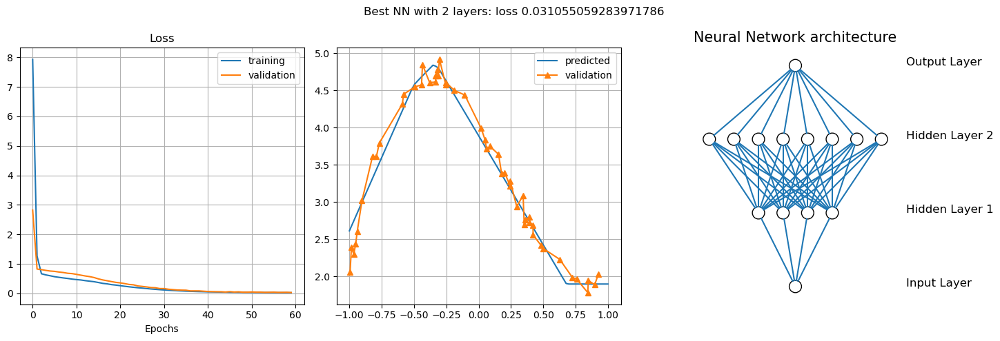

In [11]:
fig,axs=plt.subplots(1,3, figsize=(15,5))

nn=DrawNN([1]+combs[bindex].tolist()+[1])
nn.draw(axs[2])
axs[2].axis('scaled')
axs[2].axis('off')
axs[2].set_title( 'Neural Network architecture', fontsize=15 )

#print(loss_3l)
axs[0].plot(losses[bindex], label = 'training')
axs[0].plot(val_losses[bindex], label = 'validation')
axs[0].set_title('Loss')
axs[0].set_xlabel('Epochs')
axs[0].legend()
axs[0].grid()

axs[1].plot(xpred, ypred[bindex], label='predicted')
axs[1].plot(x_valid, y_valid, marker='^', label='validation')
axs[1].legend()
axs[1].grid()
fig.suptitle(f'Best NN with {2} layers: loss {bestloss}')
plt.tight_layout()


Facendo un paragone tra i risultati ottenuti con diversi ottimizzatori e funzioni di attivazione al variare del numero di layer si ottiene:

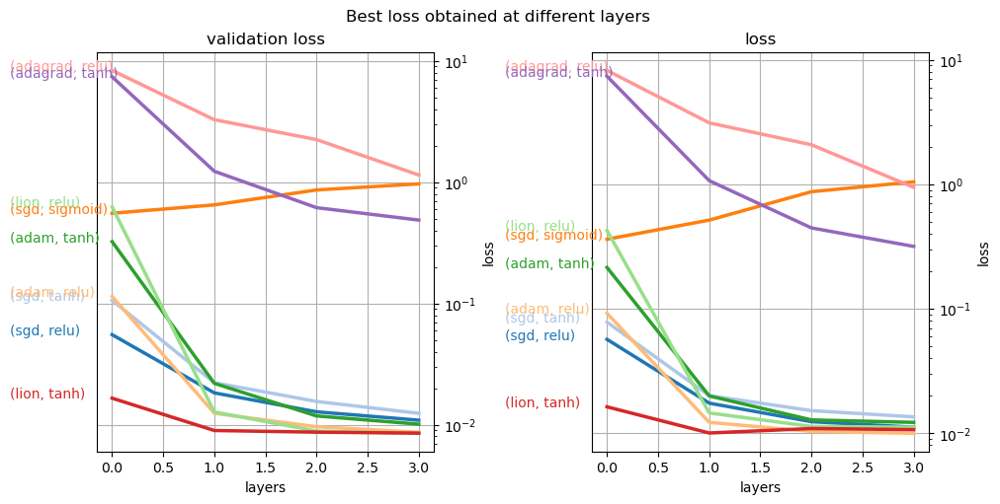

In [106]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5), layout='constrained')

fig.suptitle('Best loss obtained at different layers ')

for k in range(2):
    ax[k].set_prop_cycle(color=[
        '#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c', '#98df8a',
        '#d62728', '#ff9896', '#9467bd', '#c5b0d5', '#8c564b', '#c49c94',
        '#e377c2', '#f7b6d2', '#7f7f7f', '#c7c7c7', '#bcbd22', '#dbdb8d',
        '#17becf', '#9edae5'])

for opt in ['sgd','adam','lion', 'adagrad']: 
    for k, act in enumerate(os.listdir(opt)):
    
        loss=pd.read_csv(opt+'/'+act+'/losses.dat')
        
        min_valloss = [ min(loss[f'val_loss_{k}layers']) for k in range(1, 5)]
        min_loss = [ min(loss[f'loss_{k}layers']) for k in range(1, 5)]
        pref:str='('+opt+', '+act+') '

        ax[0].set_title('validation loss')
        line, = ax[0].plot(min_valloss, lw=2.5)
        # text to the left 
        y_pos = min_valloss[0]
        ax[0].text(-1, y_pos, pref,
            color=line.get_color())#, transform=trans)

        # loss 
        ax[1].set_title('loss')
        line, = ax[1].plot(min_loss, lw=2.5)

        #combs = combfromfile(opt+'/'+act+'/combination.dat')
        #for k in range(len(combs)):
        #    print(numparam(combs[k]), min_loss[k])
        #    ax[1].annotate(numparam(combs[k]), (k, min_loss[k]))
        # text to the left 
        y_pos = min_loss[0]
        ax[1].text(-1, y_pos, pref,
            color=line.get_color())#, transform=trans)




for k in range(2):
    # Ensure that the axis ticks only show up on the bottom and left of the plot.
    # Ticks on the right and top of the plot are generally unnecessary.
    #ax[k].spines[:].set_visible(False)
#    ax[k].tick_params(axis='both', which='both', labelsize='large',
#                   bottom=False, top=False, labelbottom=True,
#                   left=False, right=False, labelleft=True)
    ax[k].xaxis.tick_bottom()
    #ax.yaxis.tick_left()
    ax[k].set_xlabel('layers')
    ax[k].set_ylabel('loss')
    ax[k].yaxis.set_label_position("right")
    ax[k].set_yscale('log')
    ax[k].yaxis.tick_right()
    ax[k].grid()

plt.show()


Questo grafico non e' particolarmente informativo perche' il numero di neuroni per layer determina il numero di parametri che crescendo dovrebbero garantire una maggiore espressivita' per la rete, quello che cerchiamo e' una rete sufficientemente espressiva da produrre una buona stima senza imparare l'errore presente nei dati di training.

In [101]:
def combfromfile(filename:str):
    file = open(filename, 'r')
    
    lines=[line.strip() for line in file]
    
    file.close()
    
    lines=lines[1:]
    
    comb = [np.array(line.split(' '), dtype=float) for line in lines]
    
    return comb

In [102]:
def numparam(neur):
    n=0
    for k in range(len(neur)):
        n+=2*neur[k] # biases
        if (k==0):
            n+= neur[k] 
        else: 
            n+=neur[k]*neur[k-1]
    return n

In [103]:
markers=['o', '*', '^', '1', '<','p','x']

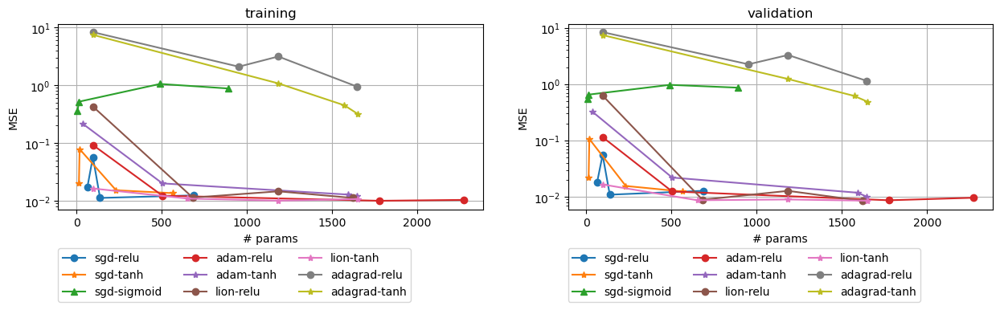

In [107]:
fig, ax = plt.subplots(1, 2, figsize=(15, 3))


for opt in ['sgd','adam','lion', 'adagrad']: 
    for k, act in enumerate(os.listdir(opt)):

    
        loss=pd.read_csv(opt+'/'+act+'/losses.dat')
        combs = combfromfile(opt+'/'+act+'/combination.dat')
        
        sizeloss = pd.DataFrame({
            'nparam':[numparam(k) for k in combs], 
            'loss':[loss[f'loss_{k+1}layers'].min() for k in range(len(combs))],
            'val_loss':[loss[f'val_loss_{k+1}layers'].min() for k in range(len(combs))]
        })
        
        
        sizeloss=sizeloss.sort_values(by='nparam', ignore_index=True)
        
        ax[0].plot(sizeloss.nparam, sizeloss.loss, ls='-',marker=markers[k], label = opt+'-'+act)
        ax[1].plot(sizeloss.nparam, sizeloss.val_loss, ls='-',marker=markers[k], label = opt+'-'+act)

ax[0].set_title('training')
ax[1].set_title('validation')

for k in range(2):
    ax[k].set_xlabel('# params')
    ax[k].set_ylabel('MSE')
    ax[k].grid()
    ax[k].legend(loc=(0,-0.5), ncols=3)
    ax[k].set_yscale('log')

plt.show()

Si puo' vedere che al crescere del numero di parametri nei casi selezionati la loss migliore tende a diminuire 

In [105]:
os.listdir('sgd')

['relu', 'tanh', 'sigmoid']

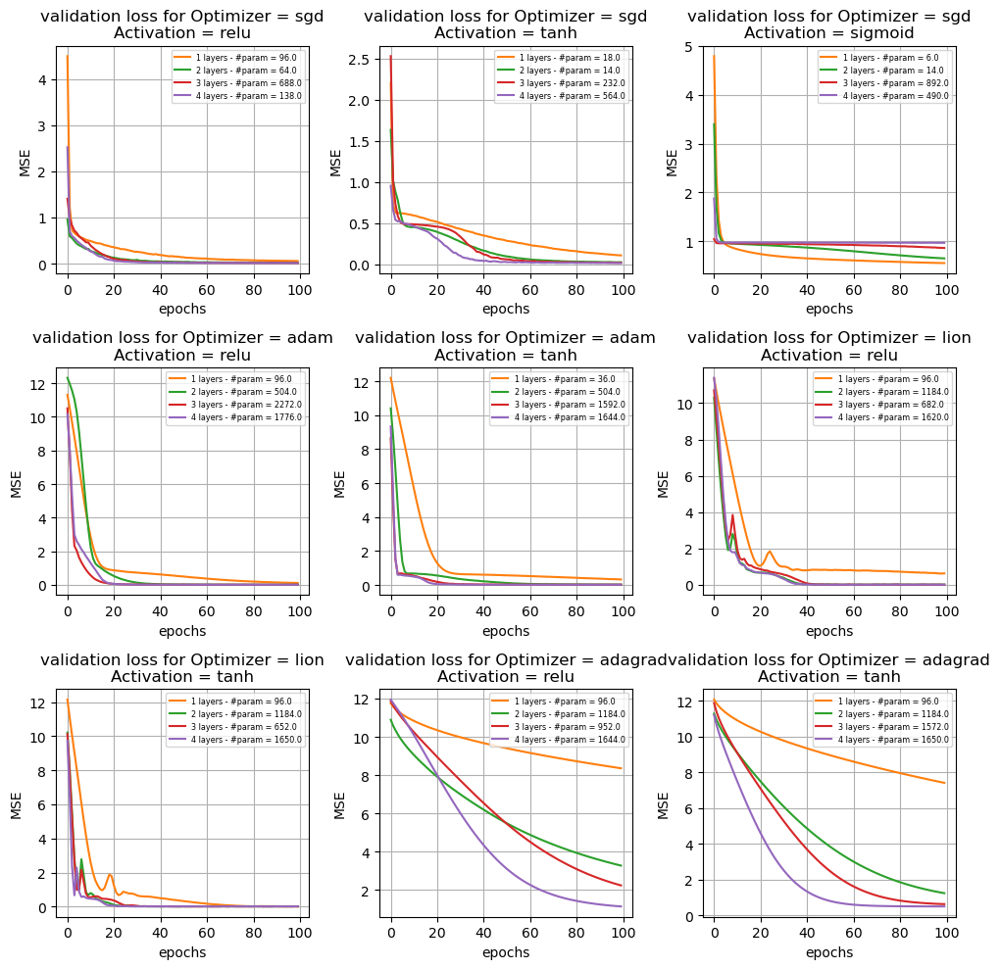

In [109]:

fig, ax = plt.subplots(3, 3, figsize=(10, 10))

counter = 0
for opt in ['sgd','adam','lion', 'adagrad']: 
    for k, act in enumerate(os.listdir(opt)):

        col = counter//3
        row = counter%3

    
        loss=pd.read_csv(opt+'/'+act+'/losses.dat')
        combs = combfromfile(opt+'/'+act+'/combination.dat')
        npar = [numparam(k) for k in combs]
        ax[col, row].set_title('validation loss for Optimizer = '+opt+'\nActivation = '+act)
        
        for k in range(4):
            #ax[col, row].plot(loss[f'loss_{k+1}layers'], label=f'train {k+1} layers - #param = {npar[k]}')
            ax[col, row].plot(loss[f'val_loss_{k+1}layers'], label=f'{k+1} layers - #param = {npar[k]}', c=f'C{k+1}')
        ax[col, row].set_xlabel('epochs')
        ax[col, row].set_ylabel('MSE')
        ax[col, row].legend(fontsize='xx-small')
        ax[col, row].grid()
        
        counter +=1        
plt.tight_layout()
plt.show()        
        


Non sembrano emergere casi particolarmente terribili di overfitting nelle reti esplorate

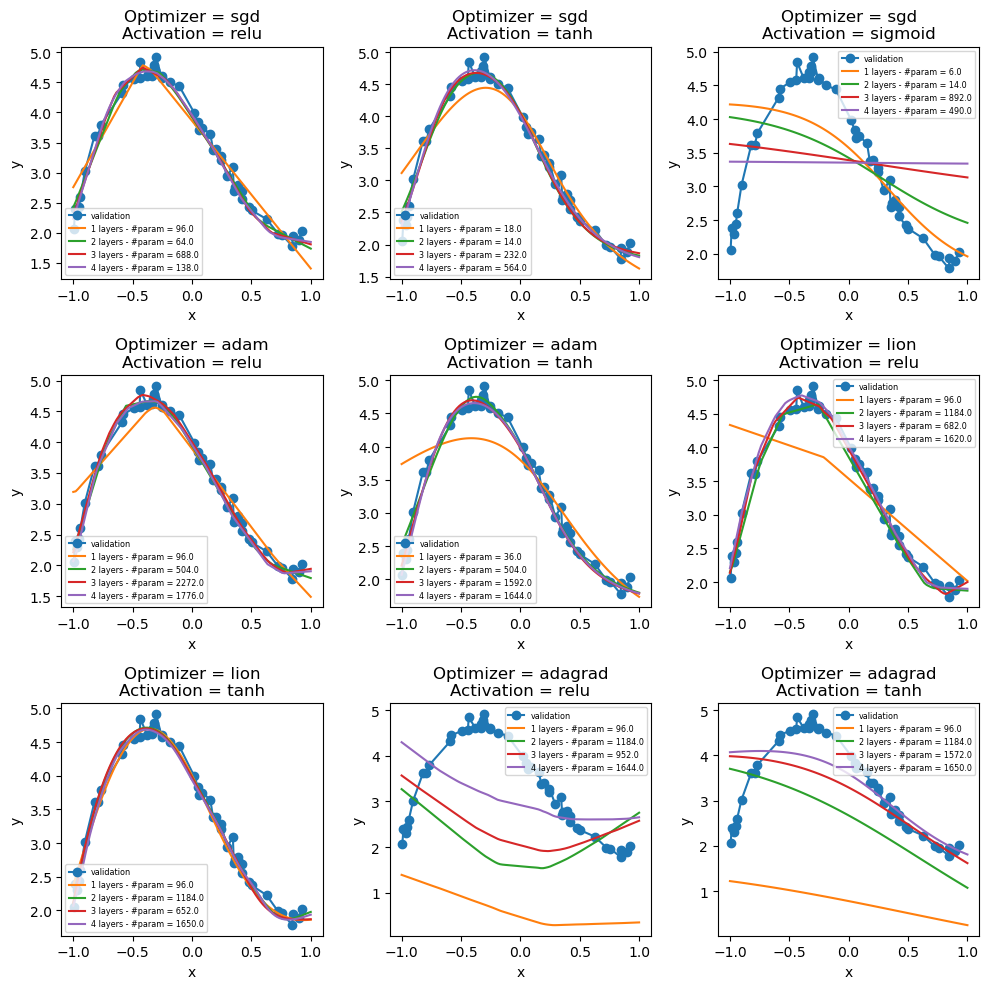

In [110]:

fig, ax = plt.subplots(3, 3, figsize=(10, 10))

counter = 0
for opt in ['sgd','adam','lion', 'adagrad']: 
    for act in os.listdir(opt):

        col = counter//3
        row = counter%3
        
        pred=pd.read_csv(opt+'/'+act+'/predictions.dat')
        combs = combfromfile(opt+'/'+act+'/combination.dat')
        npar = [numparam(k) for k in combs]
        ax[col, row].set_title('Optimizer = '+opt+'\nActivation = '+act)
        ax[col, row].plot(x_valid, y_valid, marker='o', label='validation')
        
        for k in range(4):
            #ax[k].set_title(f'{k+1} layers - #param = {npar[k]} \nbest val_loss = {min(loss.val_loss_1layers)}')
            ax[col, row].plot(pred[f'xpred_{k+1}layers'], pred[f'ypred_{k+1}layers'], label=f'{k+1} layers - #param = {npar[k]}')
        ax[col, row].set_xlabel('x')
        ax[col, row].set_ylabel('y')
        ax[col, row].legend(fontsize='xx-small')
    
        counter +=1        
plt.tight_layout()
plt.show()

I piu' competitivi a livello di dimensioni e prestazioni(validation loss) sono confrontati qua sotto:
- sgd  - relu 2 layers [64 params]
- sgd  - tanh 2 layers [14  params]
- lion - tanh 1 layers [96  params]

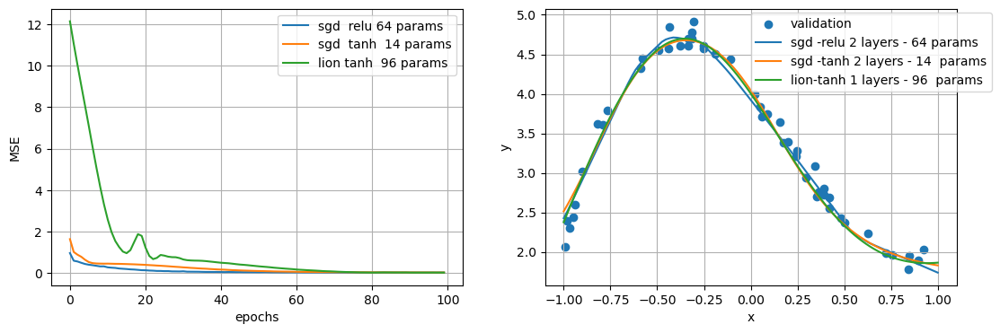

In [112]:
sgdr = pd.read_csv('sgd/relu/losses.dat')
sgdt = pd.read_csv('sgd/tanh/losses.dat')
liot = pd.read_csv('lion/tanh/losses.dat')

sgdr_pred = pd.read_csv('sgd/relu/predictions.dat')
sgdt_pred = pd.read_csv('sgd/tanh/predictions.dat')
liot_pred = pd.read_csv('lion/tanh/predictions.dat')


fig, ax = plt.subplots(1,2, figsize=(13, 4))

ax[0].plot(sgdr['val_loss_2layers'], label = 'sgd  relu 64 params')
ax[0].plot(sgdt['val_loss_2layers'], label = 'sgd  tanh  14 params')
ax[0].plot(liot['val_loss_1layers'], label = 'lion tanh  96 params')

ax[0].set_xlabel('epochs')
ax[0].set_ylabel('MSE')

ax[0].legend()
ax[0].grid()


ax[1].scatter(x_valid, y_valid, label='validation')
ax[1].plot(sgdr_pred.xpred_2layers, sgdr_pred.ypred_2layers, label = 'sgd -relu 2 layers - 64 params')
ax[1].plot(sgdt_pred.xpred_2layers, sgdt_pred.ypred_2layers, label = 'sgd -tanh 2 layers - 14  params')
ax[1].plot(liot_pred.xpred_1layers, liot_pred.ypred_1layers, label = 'lion-tanh 1 layers - 96  params')
ax[1].set_xlabel('x')
ax[1].set_ylabel('y')

ax[1].legend(loc = (0.5, 0.7))
ax[1].grid()


plt.show()

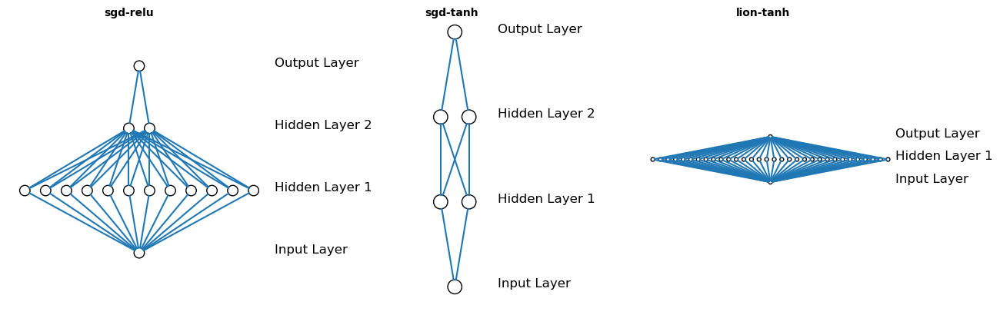

In [114]:
liotcomb = combfromfile('lion/tanh/'+'combination.dat')[0]
sgdrcomb = combfromfile('sgd/relu/'+'combination.dat')[1]
sgdtcomb = combfromfile('sgd/tanh/'+'combination.dat')[1]

fig,axs=plt.subplots(1,3, figsize=(15,5))

for k, comb in enumerate([sgdrcomb,sgdtcomb, liotcomb]):
    nn=DrawNN([1]+comb.astype(int).tolist()+[1])
    nn.draw(axs[k])
    axs[k].axis('scaled')
    axs[k].axis('off')
    axs[k].set_title( '' , fontsize=15, y=1)

    
plt.text(.23, 0.87, 'sgd-relu', transform=fig.transFigure, horizontalalignment='center', fontweight='bold')
plt.text(.51, 0.87, 'sgd-tanh',  transform=fig.transFigure, horizontalalignment='center', fontweight='bold')
plt.text(.78, 0.87, 'lion-tanh', transform=fig.transFigure, horizontalalignment='center', fontweight='bold')

plt.show()

la rete con ottimizzatore sgd e funzione di attivazione tanh sembra performare molto bene con un numero molto basso ma porebbe essere dovuto a una scelta particolarmente fortunata dei parametri quindi proviamo a riprodurla un paio di volte con inizializzazione randomica dei pesi per vedere se siamo stati semplicemente molto fortunati

In [17]:
nattemps = 100

xp = np.random.uniform(-1, 1, 100)

yp=[]
losses=[]
val_losses = []

for k in tqdm(range(nattemps)):
    mod = NN(2, [2, 2], activations=['tanh'])
    
    mod.compile(
        optimizer='sgd', loss = 'mse', metrics=['mse']
    )
    
    h = mod.fit(
        x_train, y_train,
        batch_size=32, epochs=100,
        validation_data=[x_valid, y_valid], verbose = 0
    )

    yp.append(mod.predict(xp, verbose=0))
    losses.append(h.history['loss'])
    val_losses.append(h.history['val_loss'])

  2%|███▌                                                                                                                                                                           | 2/100 [00:33<27:33, 16.87s/it]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [25:00<00:00, 15.00s/it]


/tmp/ipykernel_7634/2430505857.py:6: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[0].legend()


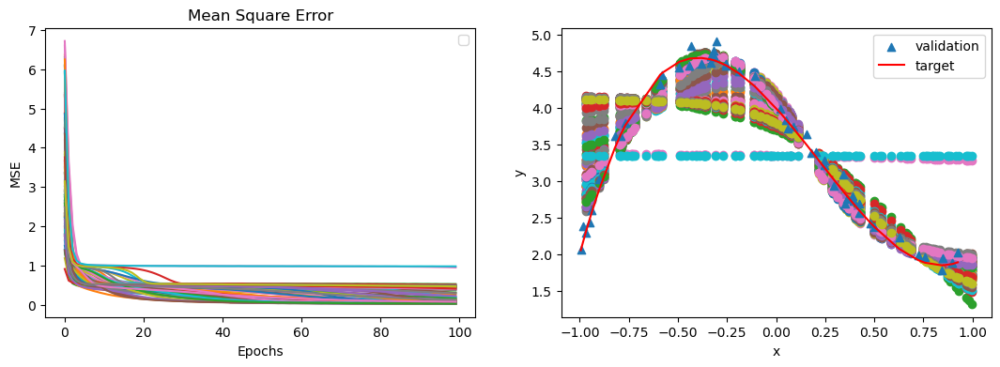

In [18]:


fig, ax = plt.subplots(1,2, figsize=(13, 4))
    
for k in range(nattemps):
    #ax[0].plot(losses[k], label = f'training run {k}')
    ax[0].plot(val_losses[k])#, label = f'validation run {k}')
    ax[0].legend()
    ax[0].set_xlabel('Epochs')
    ax[0].set_ylabel('MSE')
    
    
    ax[1].scatter(xp, yp[k])#, label='prediction')

ax[1].set_xlabel('x')
ax[1].set_ylabel('y')
ax[1].scatter(x_valid, y_valid, marker = '^',label='validation')
ax[0].set_title('Mean Square Error')
ax[1].plot(x_valid, y_target, label='target', color='r')

ax[1].legend()

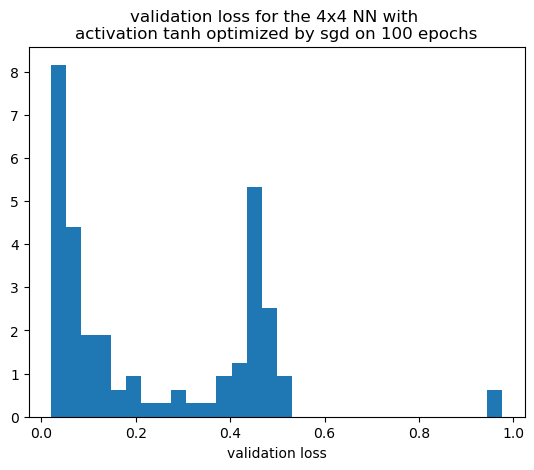

In [19]:
hist = plt.hist([val[-1] for val in val_losses], bins=30, density=True)
plt.title('validation loss for the 4x4 NN with \nactivation tanh optimized by sgd on 100 epochs')

plt.xlabel('validation loss')

plt.show()

La conclusione e' che anche una rete cosi' piccola puo' fare un buon fit anche se evidentemente su reti piu' grandi le capacita' di previsione migliorano

### Loss function



In [115]:
mse = pd.read_csv('sgd/relu/predictions.dat')
mae = pd.read_csv('sgd/relu/predictionsmae.dat')
msle= pd.read_csv('sgd/relu/predictionsmsle.dat')

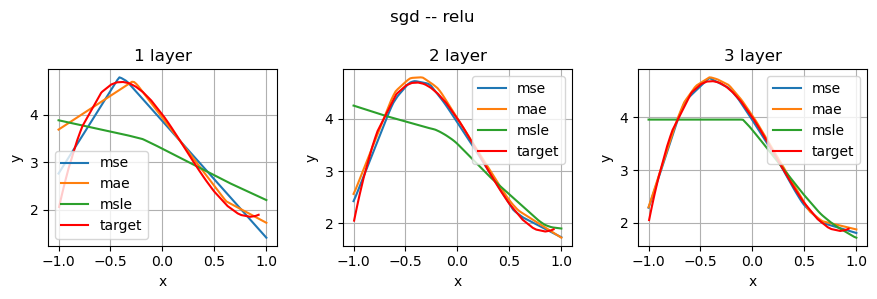

In [116]:
fig, ax = plt.subplots(1, 3, figsize=(9, 3))
fig.suptitle('sgd -- relu')

for k in range(3):
    ax[k].set_title(f'{k+1} layer')
    
    ax[k].plot(mse [f'xpred_{k+1}layers'], mse [f'ypred_{k+1}layers'], label='mse')
    ax[k].plot(mae [f'xpred_{k+1}layers'], mae [f'ypred_{k+1}layers'], label='mae')
    ax[k].plot(msle[f'xpred_{k+1}layers'], msle[f'ypred_{k+1}layers'], label='msle')
    
    ax[k].plot(x_valid, y_target, c='r', label='target')

    ax[k].legend()
    ax[k].grid()
    ax[k].set_xlabel('x')
    ax[k].set_ylabel('y')
plt.tight_layout()
plt.show()

### data outside training range

Proviamo a prendere i modelli best fuori dal range

In [121]:
msgdr = NN(n_layer=2, neurons=[32, 2], activations=['relu'])
msgdt = NN(n_layer=2, neurons=[2, 2], activations=['tanh'])
mliot = NN(n_layer=1, neurons=[32], activations=['tanh'])

msgdr.compile(
    optimizer='sgd',
    loss='mse', metrics=['mse'],
)


msgdt.compile(
    optimizer='sgd',
    loss='mse', metrics=['mse'],
)

mliot.compile(
    optimizer='lion',
    loss='mse', metrics=['mse'],
)

In [122]:
print('\t\tsgd - relu')
hist_msr = msgdr.fit(
            x=x_train, y=y_train,
            batch_size=32, epochs=100,
            shuffle=True, validation_data=(x_valid, y_valid),
            verbose=1
)
print('\t\tsgd - tanh')
hist_mst = msgdt.fit(
            x=x_train, y=y_train,
            batch_size=32, epochs=100,
            shuffle=True, validation_data=(x_valid, y_valid),
            verbose=1
)
print('\t\tlion - tanh')
hist_mlt = mliot.fit(
            x=x_train, y=y_train,
            batch_size=32, epochs=100,
            shuffle=True, validation_data=(x_valid, y_valid),
            verbose=1
)

sgd - relu
Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 8.4606 - mse: 8.4606 - val_loss: 1.0394 - val_mse: 1.0394
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.7554 - mse: 0.7554 - val_loss: 0.7334 - val_mse: 0.7334
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5296 - mse: 0.5296 - val_loss: 0.6920 - val_mse: 0.6920
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5222 - mse: 0.5222 - val_loss: 0.6822 - val_mse: 0.6822
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4696 - mse: 0.4696 - val_loss: 0.6443 - val_mse: 0.6443
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4592 - mse: 0.4592 - val_loss: 0.6406 - val_mse: 0.6406
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3747 - mse: 0.3747 - val_loss: 0.6065 - val_mse: 0.6065
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4172 - mse: 0.4172 - val_loss: 0.5762 - val_mse: 0.5762
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

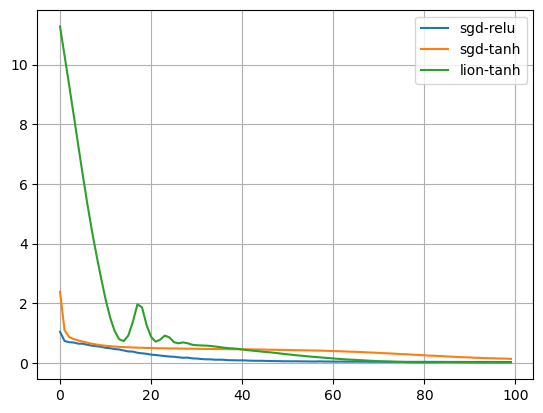

In [123]:
plt.plot(hist_msr.history['val_loss'], label='sgd-relu')
plt.plot(hist_mst.history['val_loss'], label='sgd-tanh')
plt.plot(hist_mlt.history['val_loss'], label='lion-tanh')

plt.grid()
plt.legend()

plt.show()

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


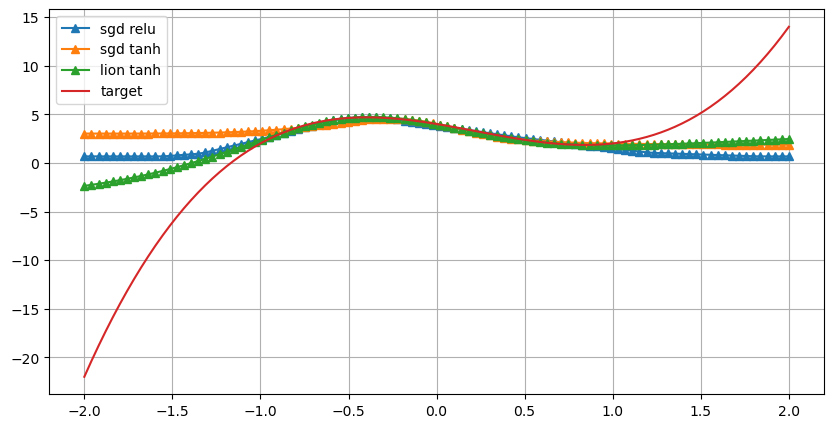

In [143]:
x_pred = np.linspace(-2, 2, 100)

pred_msr = msgdr.predict(x_pred)
pred_mst = msgdt.predict(x_pred)
pred_mlt = mliot.predict(x_pred)


plt.figure(figsize=(10, 5))
plt.plot(x_pred, pred_msr, '-^',label = 'sgd relu')
plt.plot(x_pred, pred_mst, '-^',label = 'sgd tanh')
plt.plot(x_pred, pred_mlt, '-^',label = 'lion tanh')


plt.plot(x_pred, pol(x_pred), label='target')


plt.grid()
plt.legend()
plt.show()


metti plot con la loss su questo intervallo a last epochs 

# Exercise 11.3


In [4]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Activation, Input
from model_def import test_arch
from drawing import DrawNN
import os
from tqdm import tqdm


2025-10-07 23:24:08.726263: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [5]:
def f(x, y):
    return np.sin(x**2 + y**2)

In [6]:
def gen_sinxy(nval=10000, ntrain=10000, sigma:float=0.01):
    x_valid = np.random.uniform(-3./2., 3./2., nval)
    y_valid = np.random.uniform(-3./2., 3./2., nval)
    
    x_train = np.random.uniform(-3./2., 3./2., ntrain)
    y_train = np.random.uniform(-3./2., 3./2., ntrain)
    
    
    z_target = f(x_valid, y_valid)
        
    z_valid = z_target + np.random.uniform(0, sigma, nval)
    z_train = f(x_train, y_train) + np.random.uniform(0, sigma, ntrain)

    return (x_train, y_train, z_train), (x_valid, y_valid, (z_valid, z_target))



In [12]:
def NN2(
    n_layer:int=2,
    neurons:list=[3, 2],
    activations=['relu'],
    kernel_initializer='glorot_uniform'
):
    """
    Generate a Deep Neural network specifing the architecture:
    Parameters:
        - n_layer            [int]      : number of hidden layers
        - neurons            [list(int)]: number of neurons of the corresponding index layer
        - activations        [list(str)]: list of activation functions 
            (if less than the layers the last function will be apllied to the remaining layers)
        - kernel_initializer [str]      : Initializer for the `kernel` weights matrix.
    Return:
        model [Keras.Sequential]
    """

    if (len(neurons)!=n_layer):
        raise ValueError('ERROR: List of neurons incompatible with number of layers')
    model = tf.keras.Sequential()
    model.add(Input(shape=(2,))) #input layer

    activation_index=0
    
    for layer in range(n_layer):
        model.add(
            Dense(
                neurons[layer], 
                activations[activation_index],
                kernel_initializer=kernel_initializer # to confront architectures
            )
        )

        if activation_index+1<len(activations):
            activation_index+=1
    model.add(Dense(1, activation='linear'))

    return model

In [14]:
def fitsin(neurs:list, opt:str, epochs:int=100):    
    
    mod = NN2(len(neurs), neurs)
    
    
    mod.summary()
    
    mod.compile(optimizer=opt, loss='mse', metrics=['mse'])
    
    
    hist = mod.fit(
        x=Xtrain, y=z_train,
        batch_size=32, epochs=epochs, shuffle=True,
        validation_data=(Xvalid, z_valid), verbose = 0
    )
    

    return mod, hist

In [42]:
from matplotlib.gridspec import GridSpec

def plot_mod_perf(mod, hist):
    
    x_pred = np.random.uniform(-3./2., 3./2., 10000)
    y_pred = np.random.uniform(-3./2., 3./2., 10000)

    conf = [2]+[k.output.shape[1] for k in mod.layers]
    
    fig = plt.figure(layout="constrained", figsize=(10, 5))

    title = 'NN 2' 
    for k in conf[1:]:
        title += f'x{k}' 
    
    fig.suptitle(title)
    gs = GridSpec(3, 3, figure=fig)
    ax1 = fig.add_subplot(gs[:, 0])
    DrawNN(conf).draw(ax1)
    
    # identical to ax1 = plt.subplot(gs.new_subplotspec((0, 0), colspan=3))
    ax2 = fig.add_subplot(gs[0, 1:])
    ax2.set_title('MSE')
    ax2.plot(hist.history['loss'], label='training')
    ax2.plot(hist.history['val_loss'], label='validation')
    ax2.grid()
    ax2.set_xlabel('epochs')
    ax2.set_ylabel('loss')
    ax2.legend()
    
    ax3 = fig.add_subplot(gs[1:, 1], box_aspect=1)
    hx3 = ax3.hexbin(x_valid, y_valid, C=z_valid, vmin=-1.0, vmax=1.0, gridsize=50)
    #plt.colorbar(hx, ax=ax3)
    ax3.set_title('validation', y=1)
    
    ax4 = fig.add_subplot(gs[1:, 2], box_aspect=1)
    hx4 = ax4.hexbin(
        x_pred, y_pred, 
        C=mod.predict(np.column_stack((x_pred, y_pred)), verbose=0), 
        vmin=-1.0, vmax=1.0, gridsize=50)
    plt.colorbar(hx4, ax=ax4)
    ax4.set_title('predictions')
    
    
    plt.show()


### Valori per sigma 0.01

In [7]:
(x_train, y_train, z_train), (x_valid, y_valid, (z_valid, z_target)) = gen_sinxy()

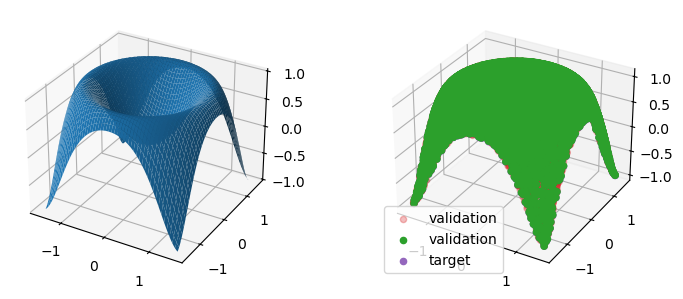

In [8]:
X, Y = np.meshgrid(np.linspace(-3./2., 3./2., 1000), np.linspace(-3./2., 3./2., 1000))

fig, ax = plt.subplots(1, 2,subplot_kw={"projection": "3d"}, figsize=(8, 3))
ax[0].plot_surface(X, Y, f(X, Y))

ax[1].scatter(x_train, y_train, z_train,  alpha= 0.3, c='C3', label = 'validation')
ax[1].scatter(x_valid, y_valid, z_valid,  alpha= 1.0, c='C2', label = 'validation')
ax[1].scatter(x_valid, y_valid, z_target, alpha= 1.0, c='C4', label = 'target')
ax[1].legend()
plt.tight_layout()
plt.show()

In [13]:
Xtrain = np.column_stack((x_train, y_train))
Xvalid = np.column_stack((x_valid, y_valid))

In [15]:
mod2x4, hist2x4 = fitsin([2,4], 'sgd')

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 2)              │             6 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │            12 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │             5 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23 (92.00 B)

 Trainable params: 23 (92.00 B)

 Non-trainable params: 0 (0.00 B)

In [16]:
mod4x2, hist4x2 = fitsin([4, 2], 'sgd')

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                 │ (None, 4)              │            12 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 2)              │            10 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │             3 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25 (100.00 B)

 Trainable params: 25 (100.00 B)

 Non-trainable params: 0 (0.00 B)

In [17]:
mod4x4, hist4x4 = fitsin([4, 4], 'sgd')

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6 (Dense)                 │ (None, 4)              │            12 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 4)              │            20 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │             5 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 37 (148.00 B)

 Trainable params: 37 (148.00 B)

 Non-trainable params: 0 (0.00 B)

In [18]:
mod4x8, hist4x8 = fitsin([4, 8], 'sgd')

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_9 (Dense)                 │ (None, 4)              │            12 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 8)              │            40 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 61 (244.00 B)

 Trainable params: 61 (244.00 B)

 Non-trainable params: 0 (0.00 B)

In [19]:
mod8x4, hist8x4 = fitsin([8, 4], 'sgd')

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_12 (Dense)                │ (None, 8)              │            24 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 4)              │            36 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 1)              │             5 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 65 (260.00 B)

 Trainable params: 65 (260.00 B)

 Non-trainable params: 0 (0.00 B)

In [20]:
mod8x8, hist8x8 = fitsin([8, 8], 'sgd')

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_15 (Dense)                │ (None, 8)              │            24 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 8)              │            72 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 105 (420.00 B)

 Trainable params: 105 (420.00 B)

 Non-trainable params: 0 (0.00 B)

In [21]:
mod8x16, hist8x16 = fitsin([8, 16], 'sgd')

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_18 (Dense)                │ (None, 8)              │            24 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 16)             │           144 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 185 (740.00 B)

 Trainable params: 185 (740.00 B)

 Non-trainable params: 0 (0.00 B)

In [22]:
mod16x8, hist16x8 = fitsin([16, 8], 'sgd')

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_21 (Dense)                │ (None, 16)             │            48 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 193 (772.00 B)

 Trainable params: 193 (772.00 B)

 Non-trainable params: 0 (0.00 B)

In [23]:
mod16x16, hist16x16 =fitsin([16,16], 'sgd')

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_24 (Dense)                │ (None, 16)             │            48 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 16)             │           272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 337 (1.32 KB)

 Trainable params: 337 (1.32 KB)

 Non-trainable params: 0 (0.00 B)

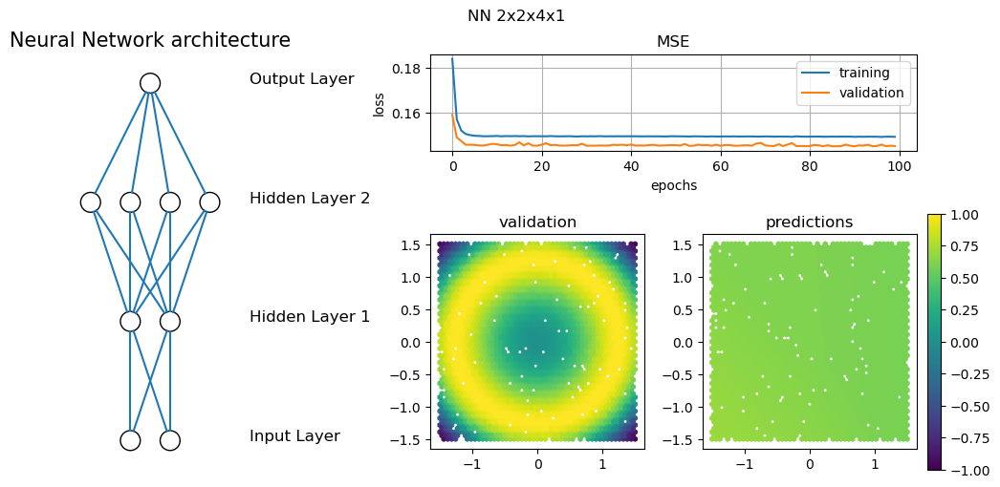

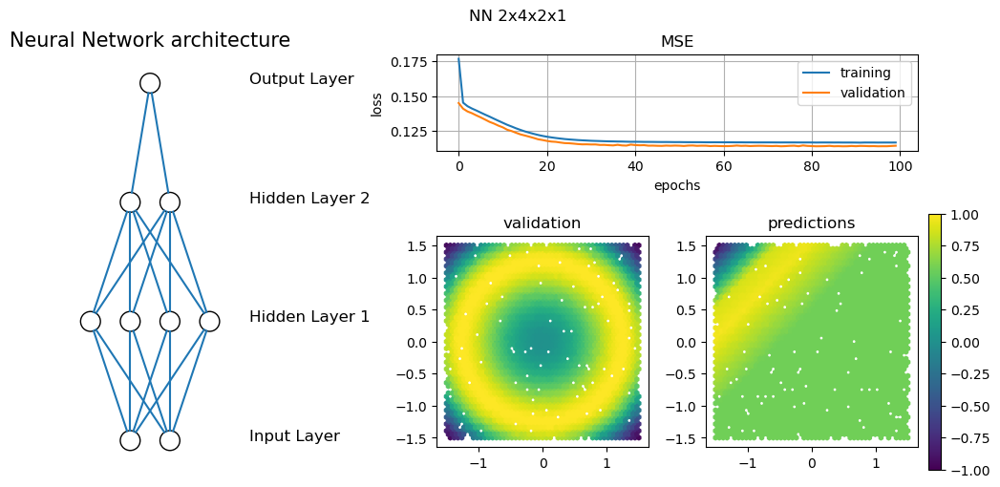

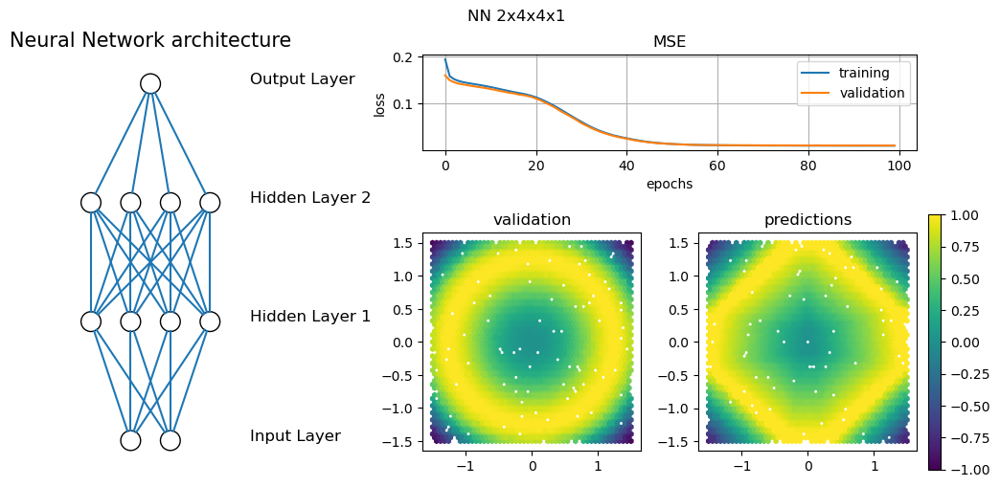

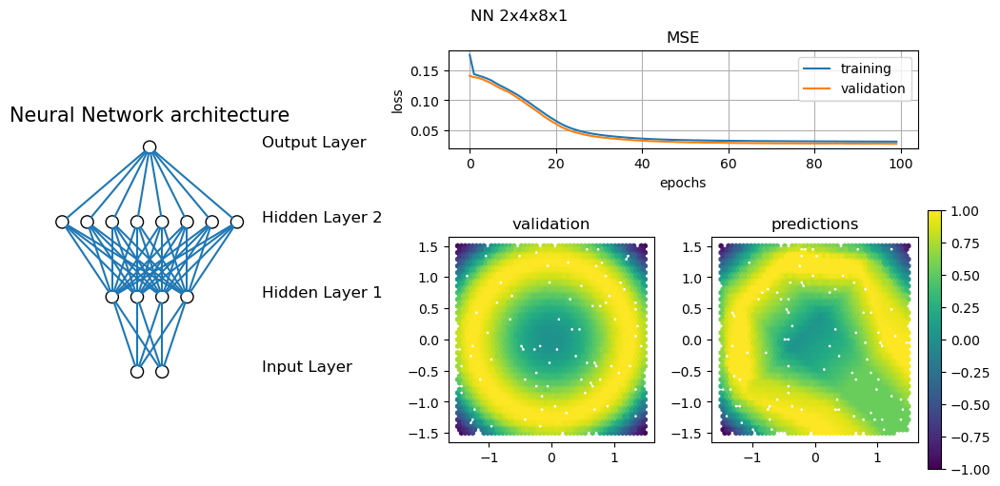

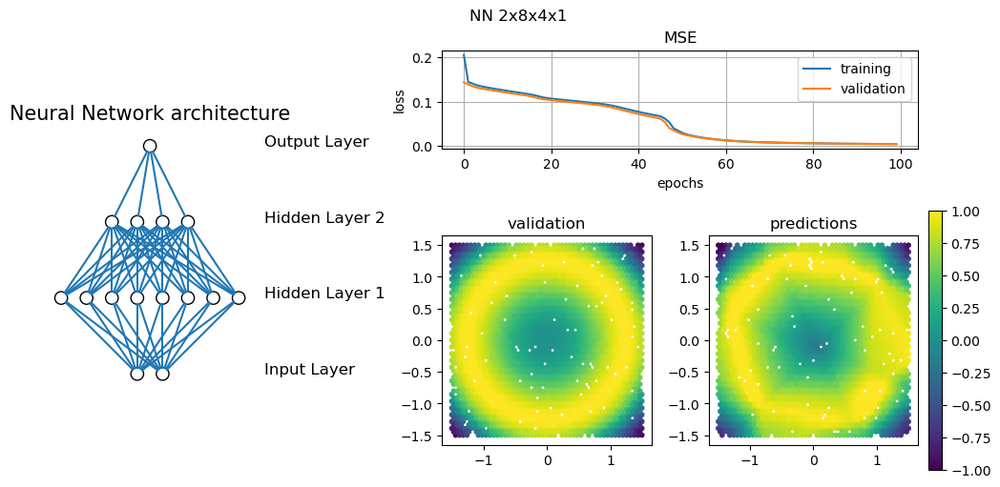

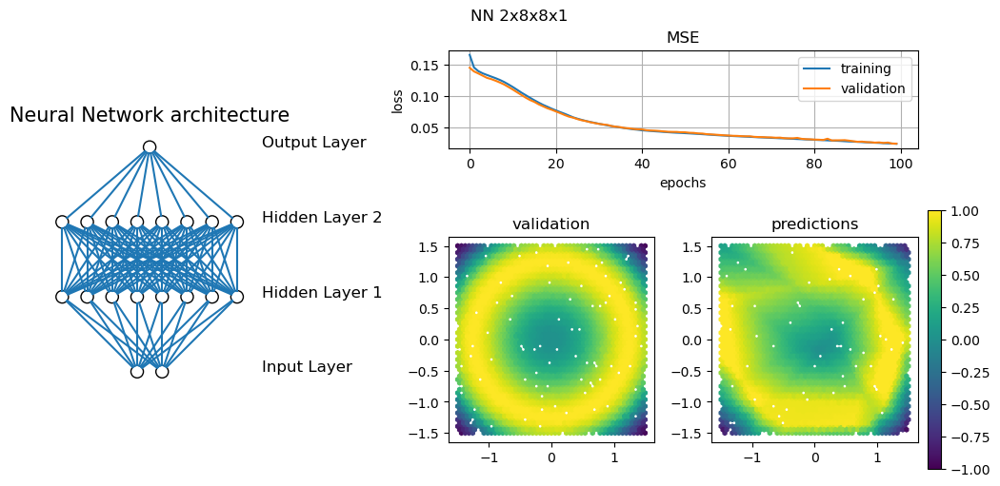

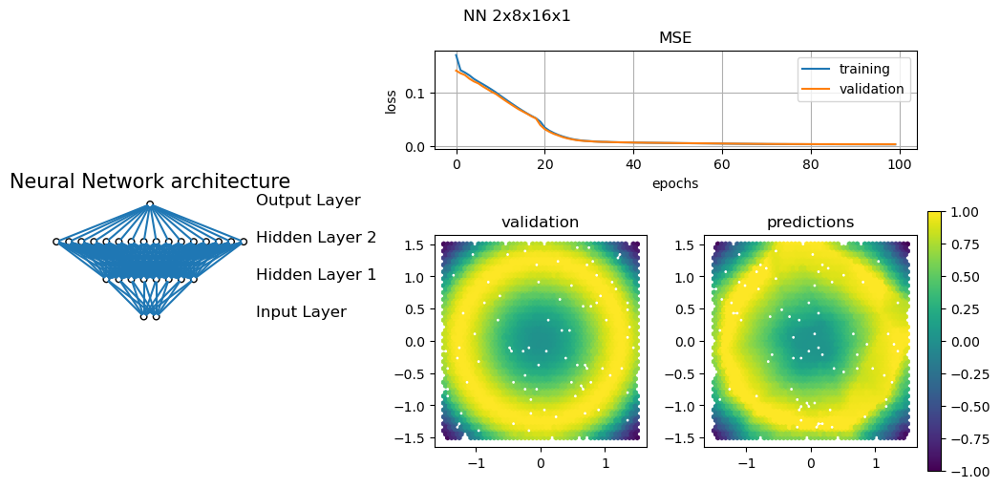

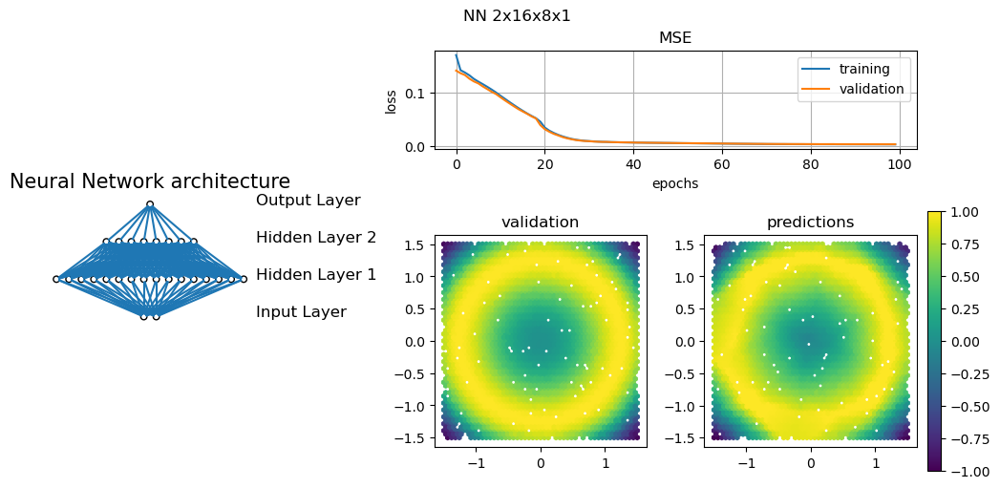

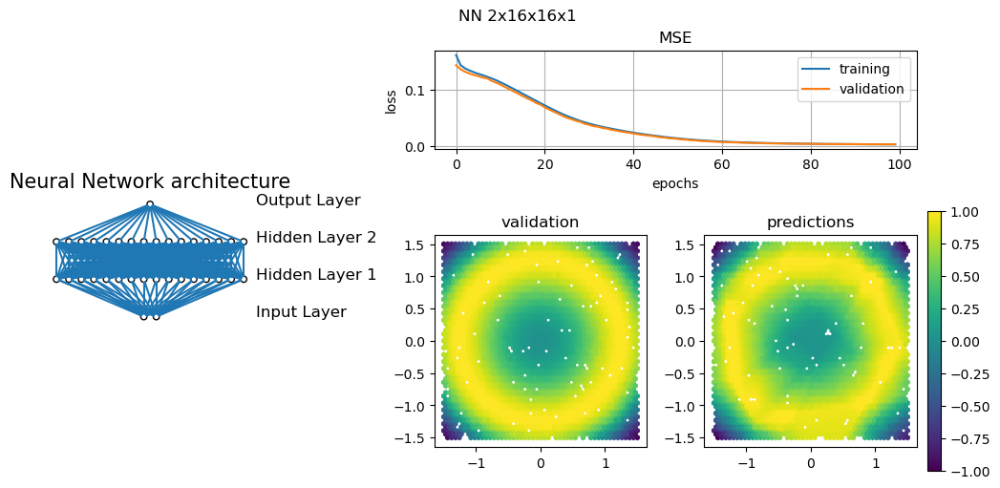

In [41]:
plot_mod_perf(mod2x4,   hist2x4) 
plot_mod_perf(mod4x2,   hist4x2) 
plot_mod_perf(mod4x4,   hist4x4) 
plot_mod_perf(mod4x8,   hist4x8) 
plot_mod_perf(mod8x4,   hist8x4)
plot_mod_perf(mod8x8,   hist8x8) 
plot_mod_perf(mod8x16,  hist8x16) 
plot_mod_perf(mod16x8,  hist8x16)
plot_mod_perf(mod16x16, hist16x16)

fai lo stesso plot ma con colonne  a diversi val di sigma x diversi ottimizzatori



### Valori per sigma = 0.1


In [43]:
(x_train, y_train, z_train), (x_valid, y_valid, (z_valid, z_target)) = gen_sinxy(sigma=0.1)

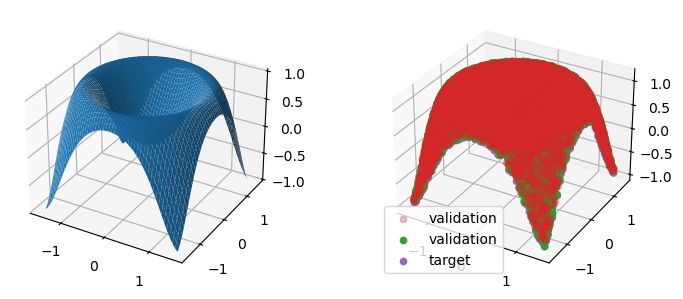

In [44]:
X, Y = np.meshgrid(np.linspace(-3./2., 3./2., 1000), np.linspace(-3./2., 3./2., 1000))

fig, ax = plt.subplots(1, 2,subplot_kw={"projection": "3d"}, figsize=(8, 3))
ax[0].plot_surface(X, Y, f(X, Y))

ax[1].scatter(x_train, y_train, z_train,  alpha= 0.3, c='C3', label = 'validation')
ax[1].scatter(x_valid, y_valid, z_valid,  alpha= 1.0, c='C2', label = 'validation')
ax[1].scatter(x_valid, y_valid, z_target, alpha= 1.0, c='C4', label = 'target')
ax[1].legend()
plt.tight_layout()
plt.show()

In [45]:
Xtrain = np.column_stack((x_train, y_train))
Xvalid = np.column_stack((x_valid, y_valid))

In [46]:
mod2x4_s01, hist2x4_s01 = fitsin([2,4], 'sgd')

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_27 (Dense)                │ (None, 2)              │             6 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_28 (Dense)                │ (None, 4)              │            12 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 1)              │             5 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23 (92.00 B)

 Trainable params: 23 (92.00 B)

 Non-trainable params: 0 (0.00 B)

In [47]:
mod4x2_s01, hist4x2_s01 = fitsin([4, 2], 'sgd')

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_30 (Dense)                │ (None, 4)              │            12 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 2)              │            10 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 1)              │             3 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25 (100.00 B)

 Trainable params: 25 (100.00 B)

 Non-trainable params: 0 (0.00 B)

In [48]:
mod4x4_s01, hist4x4_s01 = fitsin([4, 4], 'sgd')

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_33 (Dense)                │ (None, 4)              │            12 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 4)              │            20 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 1)              │             5 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 37 (148.00 B)

 Trainable params: 37 (148.00 B)

 Non-trainable params: 0 (0.00 B)

In [49]:
mod4x8_s01, hist4x8_s01 = fitsin([4, 8], 'sgd')

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_36 (Dense)                │ (None, 4)              │            12 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 8)              │            40 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 61 (244.00 B)

 Trainable params: 61 (244.00 B)

 Non-trainable params: 0 (0.00 B)

In [50]:
mod8x4_s01, hist8x4_s01 = fitsin([8, 4], 'sgd')

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_39 (Dense)                │ (None, 8)              │            24 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 4)              │            36 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 1)              │             5 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 65 (260.00 B)

 Trainable params: 65 (260.00 B)

 Non-trainable params: 0 (0.00 B)

In [51]:
mod8x8_s01, hist8x8_s01 = fitsin([8, 8], 'sgd')

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_42 (Dense)                │ (None, 8)              │            24 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 8)              │            72 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 105 (420.00 B)

 Trainable params: 105 (420.00 B)

 Non-trainable params: 0 (0.00 B)

In [52]:
mod8x16_s01, hist8x16_s01 = fitsin([8, 16], 'sgd')

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_45 (Dense)                │ (None, 8)              │            24 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 16)             │           144 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 185 (740.00 B)

 Trainable params: 185 (740.00 B)

 Non-trainable params: 0 (0.00 B)

In [53]:
mod16x8_s01, hist16x8_s01 = fitsin([16, 8], 'sgd')

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_48 (Dense)                │ (None, 16)             │            48 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 193 (772.00 B)

 Trainable params: 193 (772.00 B)

 Non-trainable params: 0 (0.00 B)

In [54]:
mod16x16_s01, hist16x16_s01 =fitsin([16,16], 'sgd')

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_51 (Dense)                │ (None, 16)             │            48 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ (None, 16)             │           272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 337 (1.32 KB)

 Trainable params: 337 (1.32 KB)

 Non-trainable params: 0 (0.00 B)

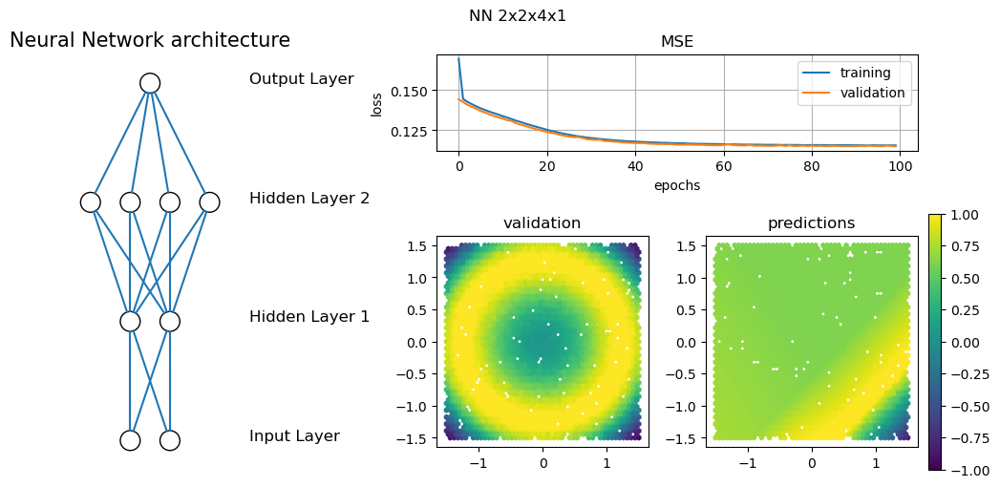

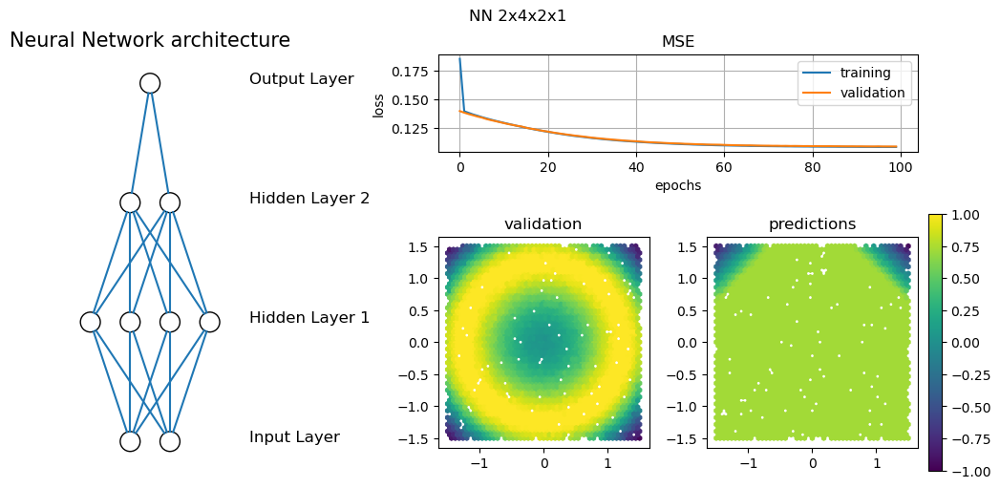

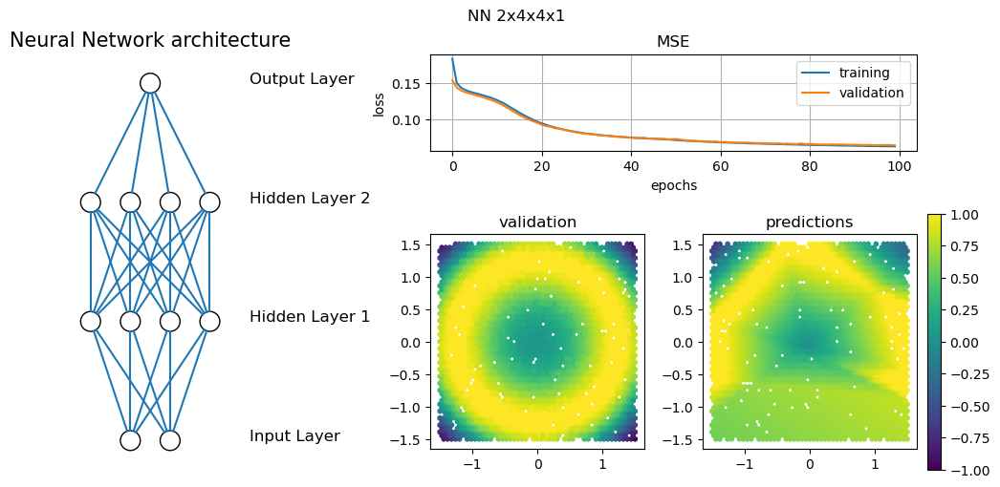

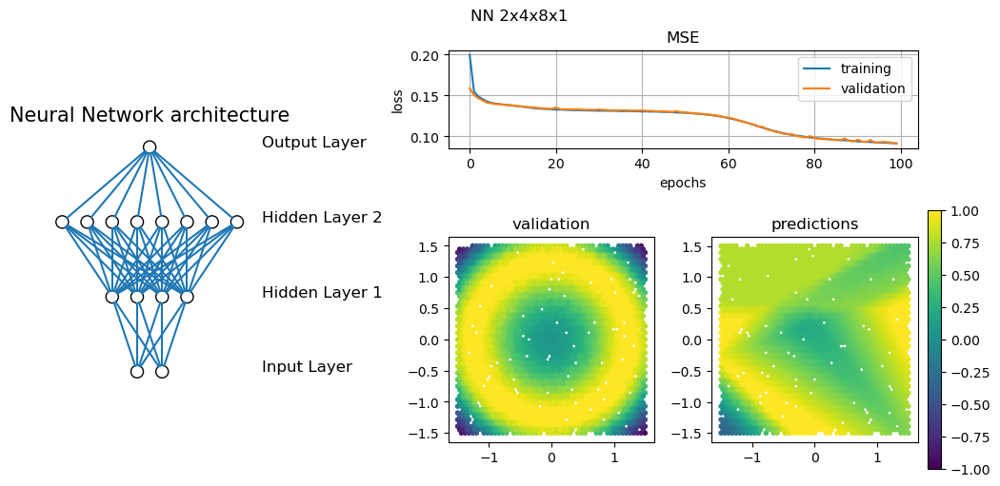

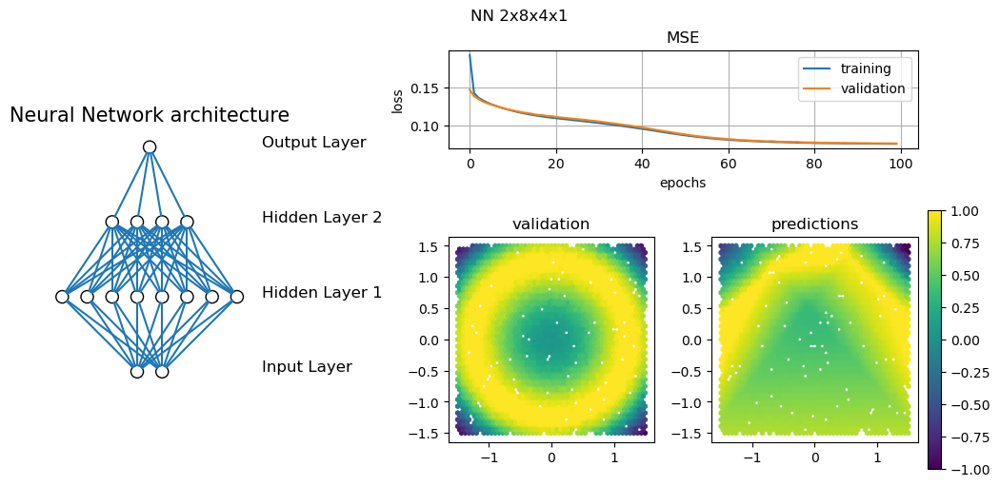

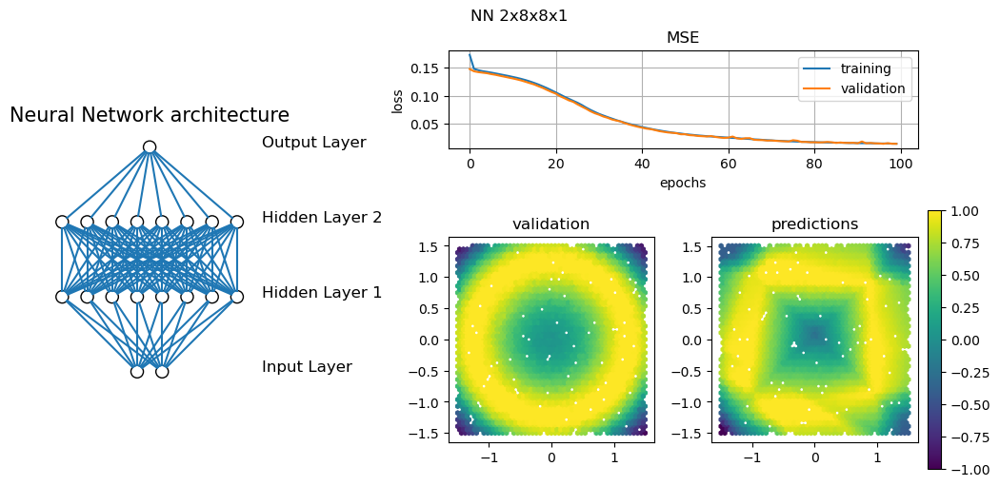

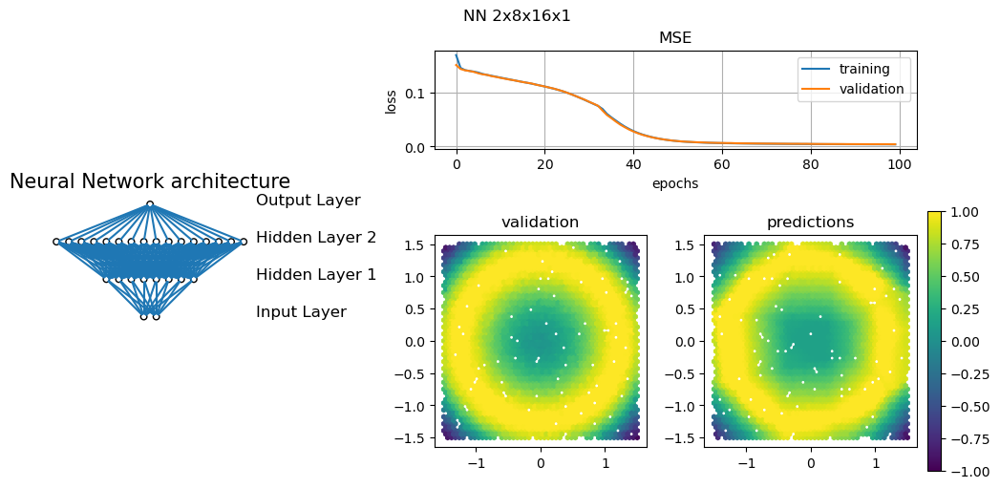

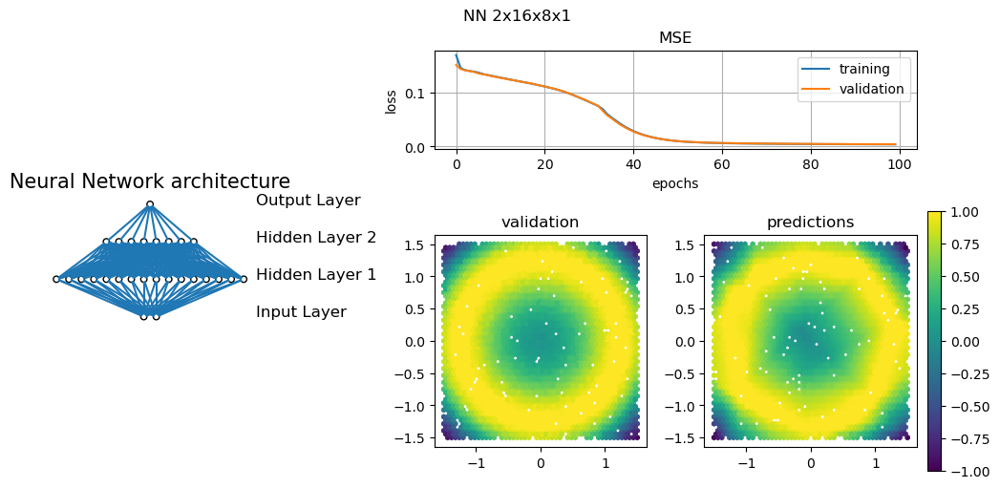

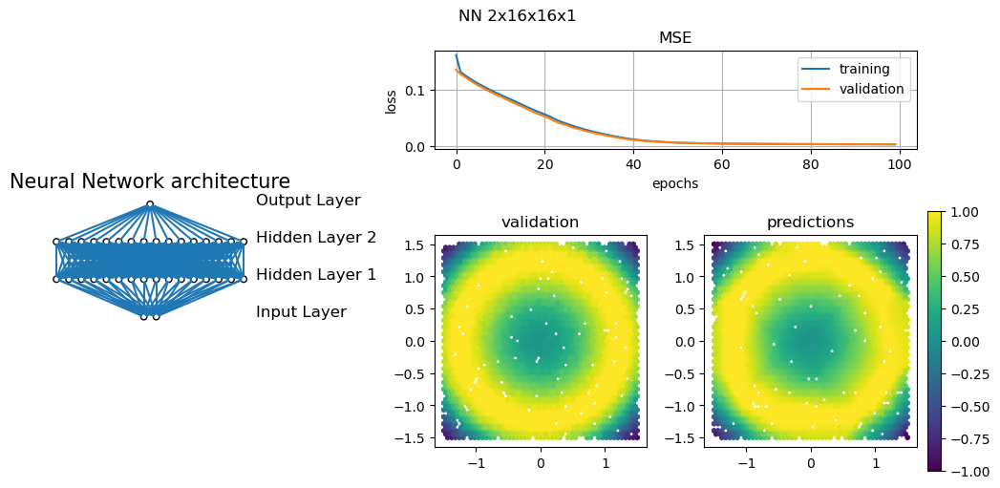

In [57]:
plot_mod_perf(mod2x4_s01,   hist2x4_s01) 
plot_mod_perf(mod4x2_s01,   hist4x2_s01) 
plot_mod_perf(mod4x4_s01,   hist4x4_s01) 
plot_mod_perf(mod4x8_s01,   hist4x8_s01) 
plot_mod_perf(mod8x4_s01,   hist8x4_s01)
plot_mod_perf(mod8x8_s01,   hist8x8_s01) 
plot_mod_perf(mod8x16_s01,  hist8x16_s01) 
plot_mod_perf(mod16x8_s01,  hist8x16_s01)
plot_mod_perf(mod16x16_s01, hist16x16_s01)

### Valori per sigma = 0.5


In [58]:
(x_train, y_train, z_train), (x_valid, y_valid, (z_valid, z_target)) = gen_sinxy(sigma=0.5)

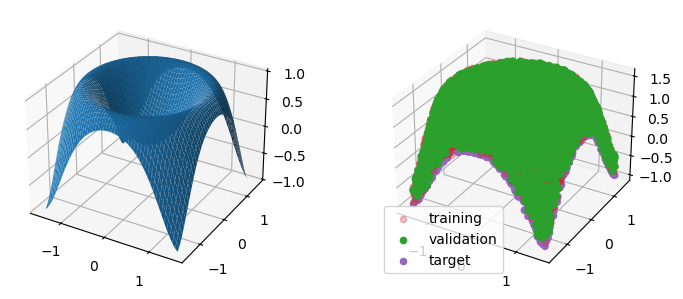

In [61]:
X, Y = np.meshgrid(np.linspace(-3./2., 3./2., 1000), np.linspace(-3./2., 3./2., 1000))

fig, ax = plt.subplots(1, 2,subplot_kw={"projection": "3d"}, figsize=(8, 3))
ax[0].plot_surface(X, Y, f(X, Y))

ax[1].scatter(x_train, y_train, z_train,  alpha= 0.3, c='C3', label = 'training')
ax[1].scatter(x_valid, y_valid, z_valid,  alpha= 1.0, c='C2', label = 'validation')
ax[1].scatter(x_valid, y_valid, z_target, alpha= 1.0, c='C4', label = 'target')
ax[1].legend()
plt.tight_layout()
plt.show()

In [62]:
Xtrain = np.column_stack((x_train, y_train))
Xvalid = np.column_stack((x_valid, y_valid))

In [63]:
mod2x4_s05, hist2x4_s05 = fitsin([2,4], 'sgd')

Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_54 (Dense)                │ (None, 2)              │             6 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 4)              │            12 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_56 (Dense)                │ (None, 1)              │             5 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23 (92.00 B)

 Trainable params: 23 (92.00 B)

 Non-trainable params: 0 (0.00 B)

In [64]:
mod4x2_s05, hist4x2_s05 = fitsin([4, 2], 'sgd')

Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_57 (Dense)                │ (None, 4)              │            12 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 2)              │            10 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 1)              │             3 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25 (100.00 B)

 Trainable params: 25 (100.00 B)

 Non-trainable params: 0 (0.00 B)

In [65]:
mod4x4_s05, hist4x4_s05 = fitsin([4, 4], 'sgd')

Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_60 (Dense)                │ (None, 4)              │            12 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 4)              │            20 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 1)              │             5 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 37 (148.00 B)

 Trainable params: 37 (148.00 B)

 Non-trainable params: 0 (0.00 B)

In [66]:
mod4x8_s05, hist4x8_s05 = fitsin([4, 8], 'sgd')

Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_63 (Dense)                │ (None, 4)              │            12 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 8)              │            40 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 61 (244.00 B)

 Trainable params: 61 (244.00 B)

 Non-trainable params: 0 (0.00 B)

In [67]:
mod8x4_s05, hist8x4_s05 = fitsin([8, 4], 'sgd')

Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_66 (Dense)                │ (None, 8)              │            24 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 4)              │            36 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 1)              │             5 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 65 (260.00 B)

 Trainable params: 65 (260.00 B)

 Non-trainable params: 0 (0.00 B)

In [68]:
mod8x8_s05, hist8x8_s05 = fitsin([8, 8], 'sgd')

Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_69 (Dense)                │ (None, 8)              │            24 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_70 (Dense)                │ (None, 8)              │            72 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 105 (420.00 B)

 Trainable params: 105 (420.00 B)

 Non-trainable params: 0 (0.00 B)

In [69]:
mod8x16_s05, hist8x16_s05 = fitsin([8, 16], 'sgd')

Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_72 (Dense)                │ (None, 8)              │            24 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 16)             │           144 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 185 (740.00 B)

 Trainable params: 185 (740.00 B)

 Non-trainable params: 0 (0.00 B)

In [70]:
mod16x8_s05, hist16x8_s05 = fitsin([16, 8], 'sgd')

Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_75 (Dense)                │ (None, 16)             │            48 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_76 (Dense)                │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_77 (Dense)                │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 193 (772.00 B)

 Trainable params: 193 (772.00 B)

 Non-trainable params: 0 (0.00 B)

In [71]:
mod16x16_s05, hist16x16_s05 =fitsin([16,16], 'sgd')

Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_78 (Dense)                │ (None, 16)             │            48 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 16)             │           272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_80 (Dense)                │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 337 (1.32 KB)

 Trainable params: 337 (1.32 KB)

 Non-trainable params: 0 (0.00 B)

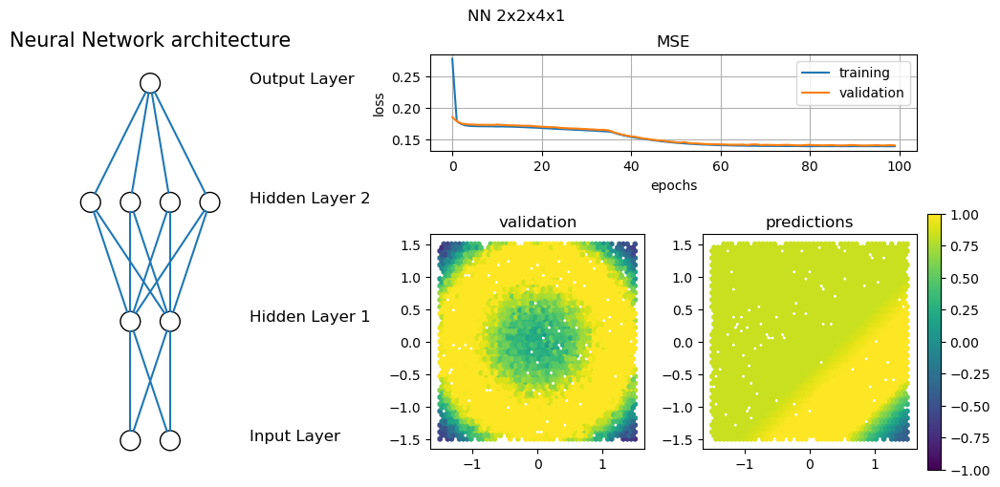

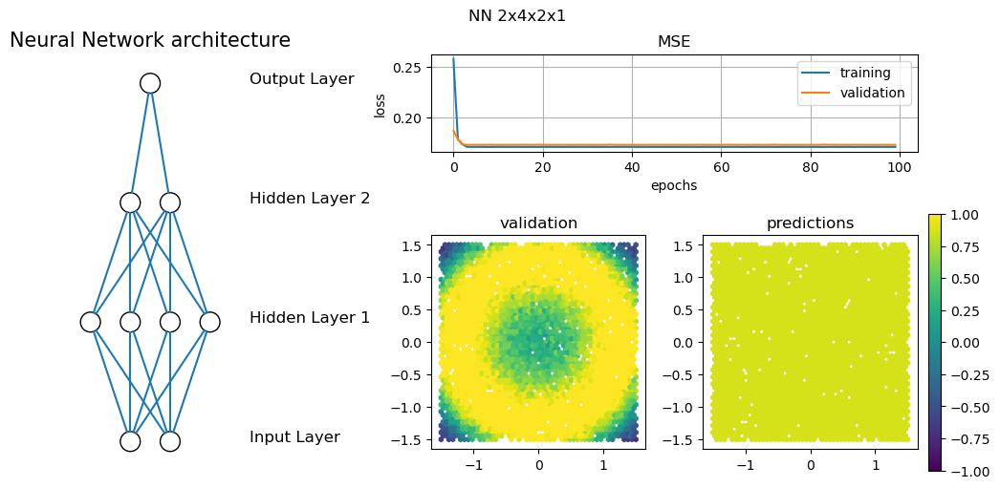

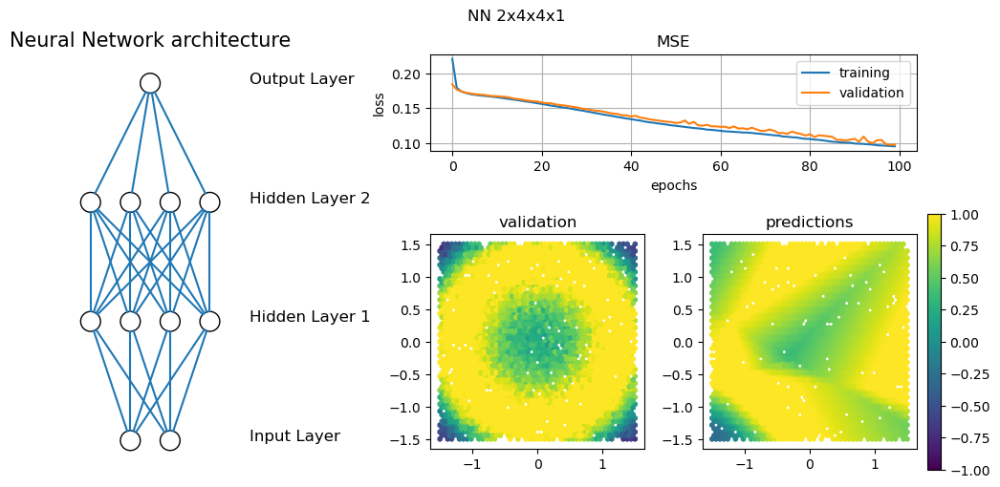

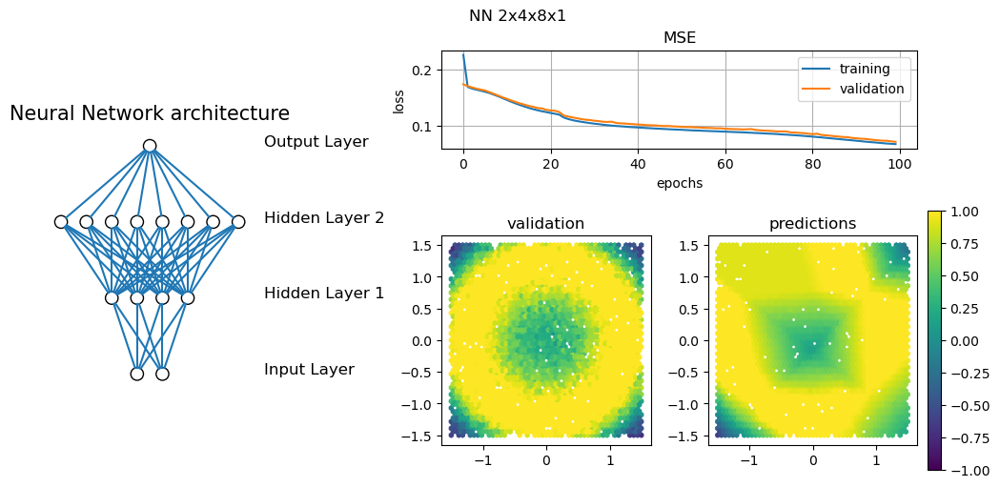

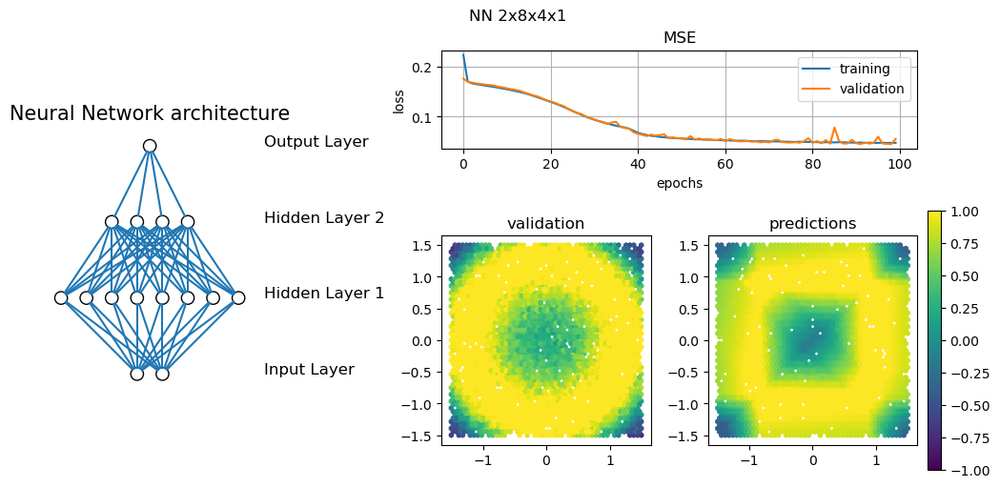

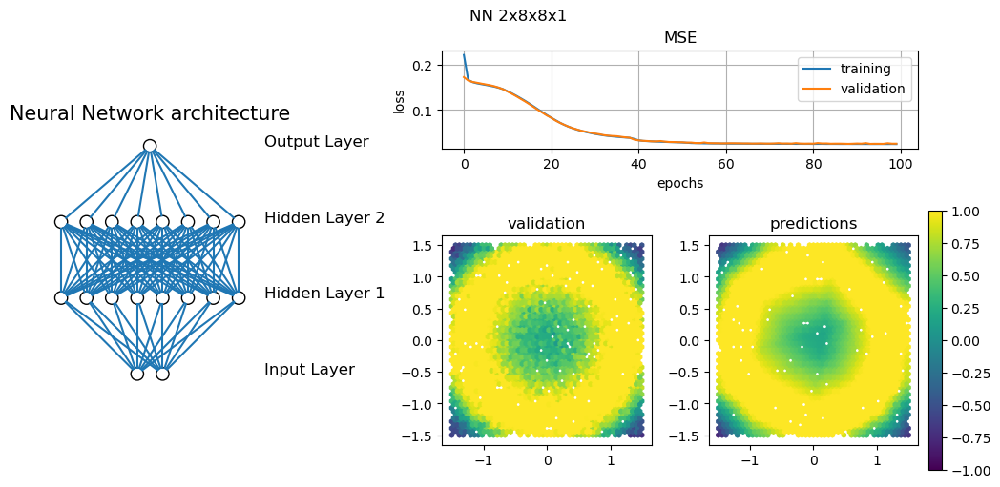

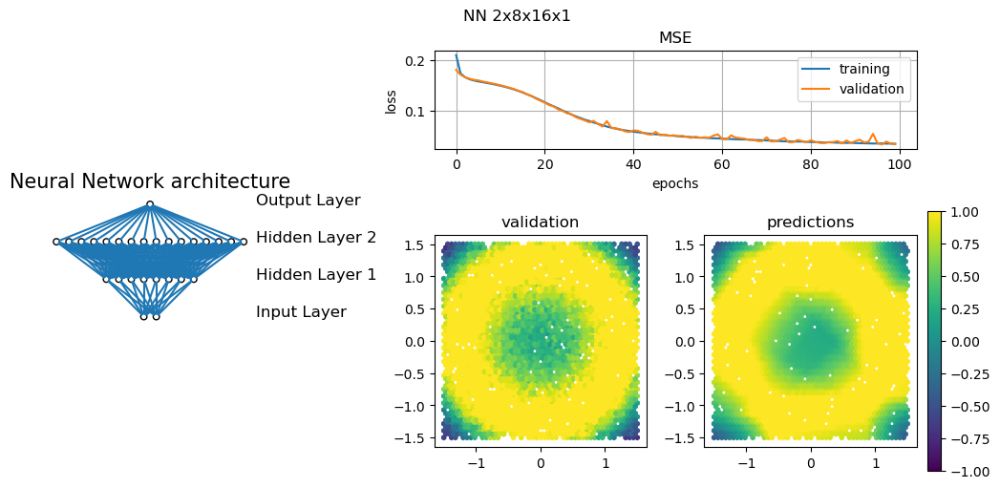

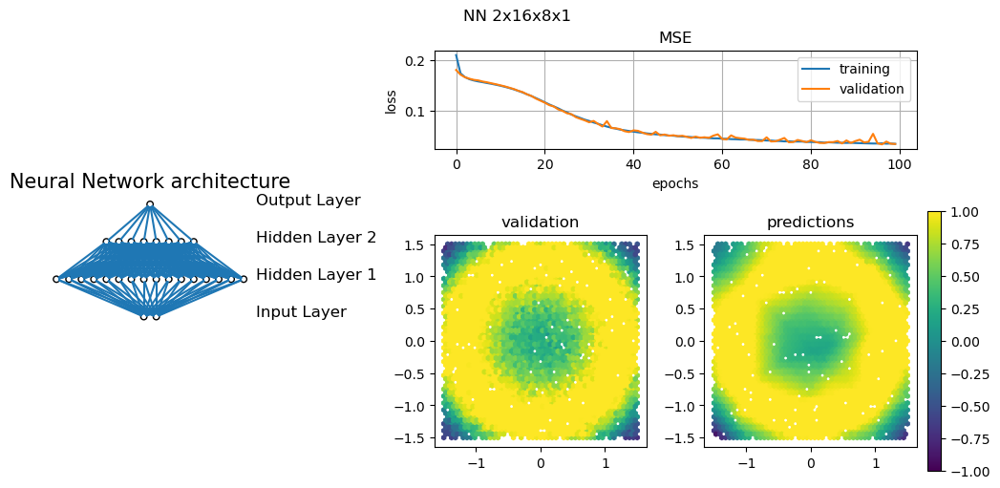

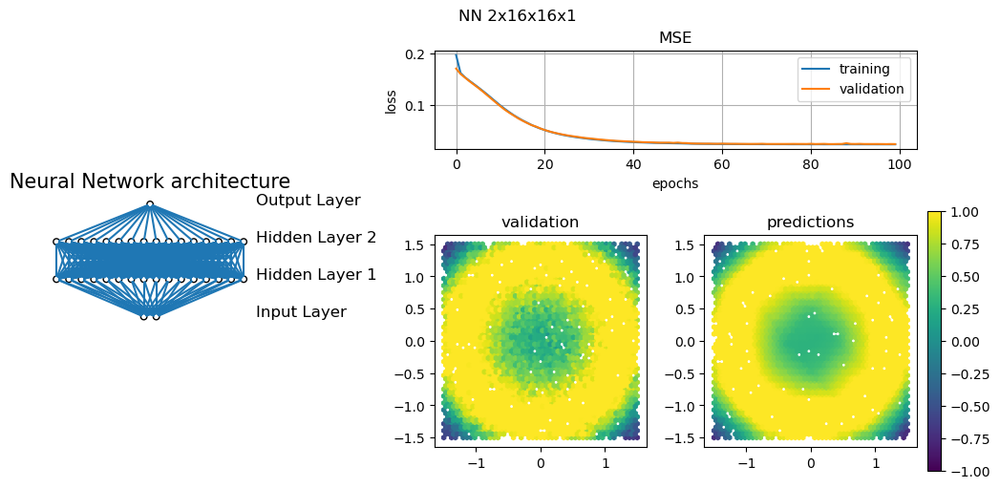

In [72]:
plot_mod_perf(mod2x4_s05,   hist2x4_s05) 
plot_mod_perf(mod4x2_s05,   hist4x2_s05) 
plot_mod_perf(mod4x4_s05,   hist4x4_s05) 
plot_mod_perf(mod4x8_s05,   hist4x8_s05) 
plot_mod_perf(mod8x4_s05,   hist8x4_s05)
plot_mod_perf(mod8x8_s05,   hist8x8_s05) 
plot_mod_perf(mod8x16_s05,  hist8x16_s05) 
plot_mod_perf(mod16x8_s05,  hist8x16_s05)
plot_mod_perf(mod16x16_s05, hist16x16_s05)

### Valori per sigma = 1


In [73]:
(x_train, y_train, z_train), (x_valid, y_valid, (z_valid, z_target)) = gen_sinxy(sigma=1)

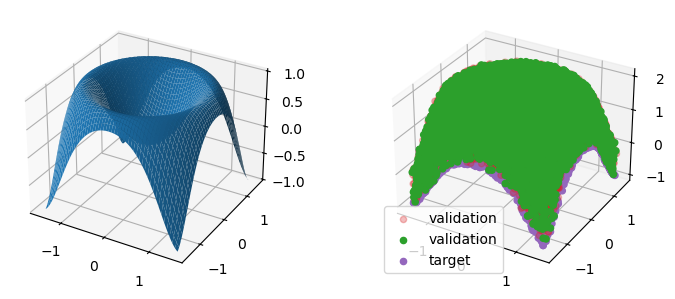

In [74]:
X, Y = np.meshgrid(np.linspace(-3./2., 3./2., 1000), np.linspace(-3./2., 3./2., 1000))

fig, ax = plt.subplots(1, 2,subplot_kw={"projection": "3d"}, figsize=(8, 3))
ax[0].plot_surface(X, Y, f(X, Y))

ax[1].scatter(x_train, y_train, z_train,  alpha= 0.3, c='C3', label = 'validation')
ax[1].scatter(x_valid, y_valid, z_valid,  alpha= 1.0, c='C2', label = 'validation')
ax[1].scatter(x_valid, y_valid, z_target, alpha= 1.0, c='C4', label = 'target')
ax[1].legend()
plt.tight_layout()
plt.show()

In [75]:
Xtrain = np.column_stack((x_train, y_train))
Xvalid = np.column_stack((x_valid, y_valid))

In [76]:
mod2x4_s1, hist2x4_s1 = fitsin([2,4], 'sgd')

Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_81 (Dense)                │ (None, 2)              │             6 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 4)              │            12 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 1)              │             5 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23 (92.00 B)

 Trainable params: 23 (92.00 B)

 Non-trainable params: 0 (0.00 B)

In [77]:
mod4x2_s1, hist4x2_s1 = fitsin([4, 2], 'sgd')

Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 4)              │            12 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 2)              │            10 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 1)              │             3 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25 (100.00 B)

 Trainable params: 25 (100.00 B)

 Non-trainable params: 0 (0.00 B)

In [78]:
mod4x4_s1, hist4x4_s1 = fitsin([4, 4], 'sgd')

Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_87 (Dense)                │ (None, 4)              │            12 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 4)              │            20 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 1)              │             5 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 37 (148.00 B)

 Trainable params: 37 (148.00 B)

 Non-trainable params: 0 (0.00 B)

In [79]:
mod4x8_s1, hist4x8_s1 = fitsin([4, 8], 'sgd')

Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_90 (Dense)                │ (None, 4)              │            12 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_91 (Dense)                │ (None, 8)              │            40 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 61 (244.00 B)

 Trainable params: 61 (244.00 B)

 Non-trainable params: 0 (0.00 B)

In [ ]:
mod8x4_s1, hist8x4_s1 = fitsin([8, 4], 'sgd')

Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_93 (Dense)                │ (None, 8)              │            24 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 4)              │            36 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 1)              │             5 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 65 (260.00 B)

 Trainable params: 65 (260.00 B)

 Non-trainable params: 0 (0.00 B)

In [ ]:
mod8x8_s1, hist8x8_s1 = fitsin([8, 8], 'sgd')

In [ ]:
mod8x16_s1, hist8x16_s1 = fitsin([8, 16], 'sgd')

In [ ]:
mod16x8_s1, hist16x8_s1 = fitsin([16, 8], 'sgd')

In [ ]:
mod16x16_s1, hist16x16_s1 =fitsin([16,16], 'sgd')

In [ ]:
plot_mod_perf(mod2x4_s1,   hist2x4_s1) 
plot_mod_perf(mod4x2_s1,   hist4x2_s1) 
plot_mod_perf(mod4x4_s1,   hist4x4_s1) 
plot_mod_perf(mod4x8_s1,   hist4x8_s1) 
plot_mod_perf(mod8x4_s1,   hist8x4_s1)
plot_mod_perf(mod8x8_s1,   hist8x8_s1) 
plot_mod_perf(mod8x16_s1,  hist8x16_s1) 
plot_mod_perf(mod16x8_s1,  hist8x16_s1)
plot_mod_perf(mod16x16_s1, hist16x16_s1)